# Discriminating normal and abnormal users

In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, WeightedRandomSampler
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import torch.nn.init as init

from simple_nn_model import SimpleNN
import pandas as pd

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


### load data

In [3]:
feature_matrix_nona_nostr = pd.read_csv("dataset/feature_matrix_nona_nostr.tdt", sep='\t')
feature_matrix_nona_nostr

,user_id,O,C,E,A,N,AVERAGE_COUNT_PER_UNIQUE(logons.activity),AVERAGE_COUNT_PER_UNIQUE(logons.pc),COUNT(logons),ENTROPY(logons.activity),...,WEEKDAY(LAST(emails.date)),WEEKDAY(LAST(https.date)),WEEKDAY(LAST(logons.date)),YEAR(FIRST(emails.date)),YEAR(FIRST(https.date)),YEAR(FIRST(logons.date)),YEAR(LAST(emails.date)),YEAR(LAST(https.date)),YEAR(LAST(logons.date)),label
0,CEL0561,40,39,36,19,40,480.5,0.958126,961,0.653442,...,0,0,0,2010,2010,2010,2011,2011,2011,0
1,CRD0624,26,22,17,39,32,50.0,0.099701,100,0.693147,...,4,4,4,2010,2010,2010,2010,2010,2010,0
2,JFC0557,22,16,23,40,33,480.5,0.958126,961,0.653442,...,0,0,0,2010,2010,2010,2011,2011,2011,0
3,ASD0577,40,48,36,14,37,346.0,0.689930,692,0.693147,...,0,0,0,2010,2010,2010,2011,2011,2011,0
4,MAR0955,36,44,23,44,25,302.0,0.602193,604,0.693147,...,4,4,4,2010,2010,2010,2011,2011,2011,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,DTT0076,42,16,34,24,28,346.0,0.689930,692,0.693147,...,0,0,0,2010,2010,2010,2011,2011,2011,0
996,PRM0740,45,40,45,42,27,346.0,0.689930,692,0.693147,...,0,0,0,2010,2010,2010,2011,2011,2011,0
997,FGW0853,25,35,20,40,39,455.0,0.907278,910,0.693147,...,0,0,0,2010,2010,2010,2011,2011,2011,0
998,JSH0330,20,16,23,24,28,346.0,0.689930,692,0.693147,...,0,0,0,2010,2010,2010,2011,2011,2011,0


### add binary label

In [4]:
data_with_blabel = feature_matrix_nona_nostr.iloc[:, 1:]
data_with_blabel['blabel'] = feature_matrix_nona_nostr['label']
data_with_blabel.loc[data_with_blabel['blabel'] > 0, 'blabel'] = 1
data_with_blabel

,O,C,E,A,N,AVERAGE_COUNT_PER_UNIQUE(logons.activity),AVERAGE_COUNT_PER_UNIQUE(logons.pc),COUNT(logons),ENTROPY(logons.activity),ENTROPY(logons.pc),...,WEEKDAY(LAST(https.date)),WEEKDAY(LAST(logons.date)),YEAR(FIRST(emails.date)),YEAR(FIRST(https.date)),YEAR(FIRST(logons.date)),YEAR(LAST(emails.date)),YEAR(LAST(https.date)),YEAR(LAST(logons.date)),label,blabel
0,40,39,36,19,40,480.5,0.958126,961,0.653442,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0
1,26,22,17,39,32,50.0,0.099701,100,0.693147,0.00000,...,4,4,2010,2010,2010,2010,2010,2010,0,0
2,22,16,23,40,33,480.5,0.958126,961,0.653442,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0
3,40,48,36,14,37,346.0,0.689930,692,0.693147,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0
4,36,44,23,44,25,302.0,0.602193,604,0.693147,0.00000,...,4,4,2010,2010,2010,2011,2011,2011,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,42,16,34,24,28,346.0,0.689930,692,0.693147,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0
996,45,40,45,42,27,346.0,0.689930,692,0.693147,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0
997,25,35,20,40,39,455.0,0.907278,910,0.693147,0.36856,...,0,0,2010,2010,2010,2011,2011,2011,0,0
998,20,16,23,24,28,346.0,0.689930,692,0.693147,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0


In [5]:
data_with_blabel.label.value_counts()

label
0    930
1     30
2     30
3     10
Name: count, dtype: int64

In [6]:
data_with_blabel.blabel.value_counts()

blabel
0    930
1     70
Name: count, dtype: int64

### define hyperparameters

In [7]:
# Define hyperparameters
batch_size = 16
input_size = data_with_blabel.shape[1]-2  # Adjust based on the number of features in your tabular data
target_lr = 0.001
warmup_epochs = 5
num_epochs = 10000

### evaluate the model on disciminating norman and abnormal users (repeat 100 times)

##################################### Iteration  1 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6989602236585184, Training Accuracy: 55.142857142857146%, Avg. Validation Loss: 0.468786929334913, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5146821493452246, Training Accuracy: 77.42857142857143%, Avg. Validation Loss: 0.26254287574972424, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.37979732250625436, Training Accuracy: 91.85714285714286%, Avg. Validation Loss: 0.23511195608547755, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3167974870990623, Training Accuracy: 96.0%, Avg. Validation Loss: 0.2105428491319929, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2541154067624699, Training Accuracy: 97.85714285714286%, Avg. Validation Loss: 0.1978490012032645, Validation Accuracy: 97.

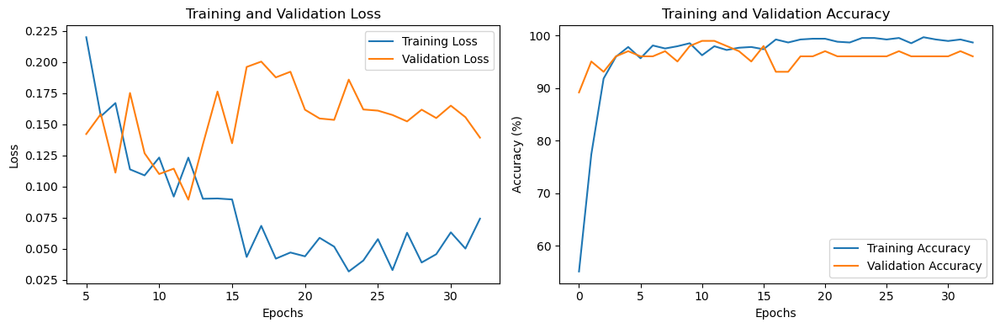

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8350549816727757
[[179   5]
 [  0  14]]
##################################### Iteration  2 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5864821462468668, Training Accuracy: 70.0%, Avg. Validation Loss: 0.35086807182856966, Validation Accuracy: 90.19607843137256%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.41298954730684106, Training Accuracy: 85.85714285714286%, Avg. Validation Loss: 0.21586354502609797, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2908564270897345, Training Accuracy: 95.0%, Avg. Validation Loss: 0.19193650356360845, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.26352010464126413, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.20885535329580307, Validation Accuracy: 88.23529411764706%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.18883939544585618, Tr

Epoch [41/10000], Avg. Training Loss: 0.05153350773352114, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.08648231199809484, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.05398834458636967, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.10945367706673485, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.06997813131998885, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.08979989056076322, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.04731047200039029, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.10838743671774864, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.07956009070304307, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.07772412816328662, Validation Accuracy: 96

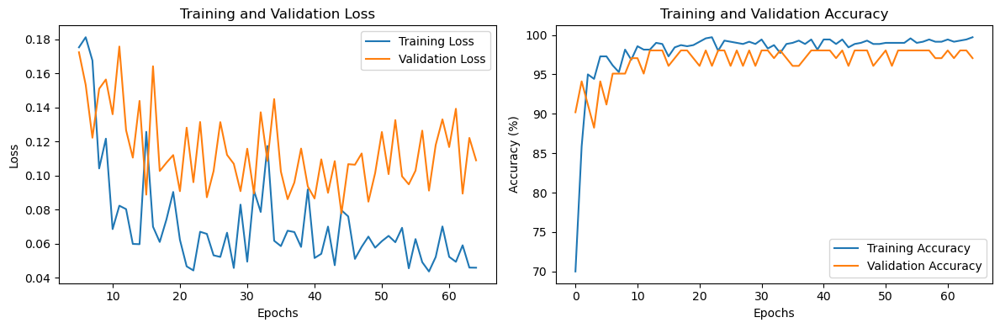

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8350549816727757
[[179   5]
 [  0  14]]
##################################### Iteration  3 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6412590532140299, Training Accuracy: 61.142857142857146%, Avg. Validation Loss: 0.34826513699122835, Validation Accuracy: 97.05882352941177%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5044230432672934, Training Accuracy: 77.71428571428571%, Avg. Validation Loss: 0.19469082994120462, Validation Accuracy: 98.03921568627452%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3384352651509372, Training Accuracy: 92.14285714285714%, Avg. Validation Loss: 0.18241715111902781, Validation Accuracy: 97.05882352941177%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.30853458189151506, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.1355779373220035, Validation Accuracy: 99.01960784313725%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

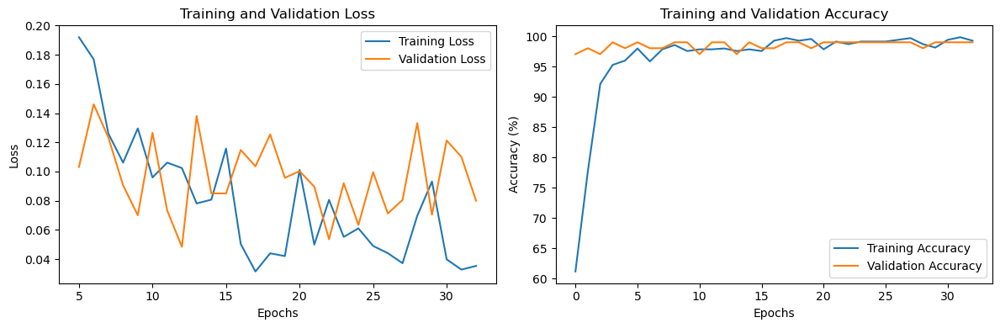

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8557902403495994
[[181   3]
 [  1  13]]
##################################### Iteration  4 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7590960785746574, Training Accuracy: 56.57142857142857%, Avg. Validation Loss: 0.3323981591633388, Validation Accuracy: 87.25490196078431%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4246758127754385, Training Accuracy: 84.14285714285714%, Avg. Validation Loss: 0.2301564450774874, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.32123430276458914, Training Accuracy: 92.71428571428571%, Avg. Validation Loss: 0.17089109548500606, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.26071636378765106, Training Accuracy: 96.28571428571429%, Avg. Validation Loss: 0.1226741863148553, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

Epoch [41/10000], Avg. Training Loss: 0.05768754303624684, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.09194499254226685, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.05728024252775041, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.057006276079586575, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.030737127537246455, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.09345690746392522, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.06596044031903148, Training Accuracy: 99.0%, Avg. Validation Loss: 0.08858471470219749, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.03461650852113962, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.10144579091242381, Validation Accuracy: 99.0196078431

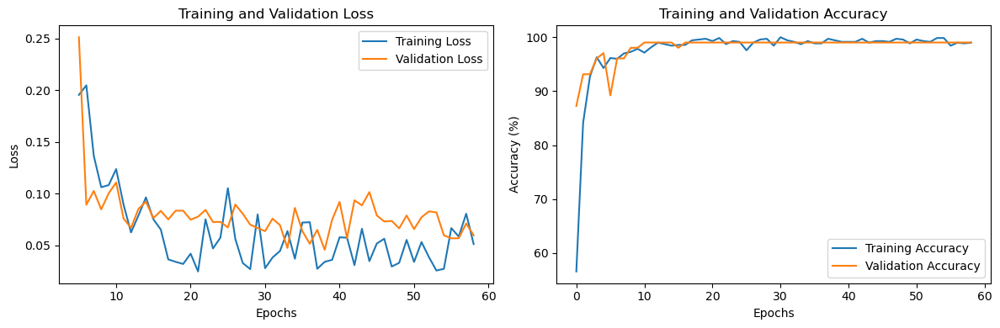

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.6708229426433916
[[181   3]
 [  5   9]]
##################################### Iteration  5 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6374642036177895, Training Accuracy: 67.57142857142857%, Avg. Validation Loss: 0.6344778793198722, Validation Accuracy: 64.70588235294117%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.530191496014595, Training Accuracy: 79.85714285714286%, Avg. Validation Loss: 0.39248429451669964, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.40570048513737594, Training Accuracy: 91.57142857142857%, Avg. Validation Loss: 0.32392618911606924, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3241151815110987, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.2839672863483429, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

Epoch [42/10000], Avg. Training Loss: 0.04880941041152586, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.10454286102737699, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.035550144289366224, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.11452744049685341, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.09642030154778199, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.06822738743254117, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.06965222133492882, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.06028512492775917, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.054429730315777386, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.10802285905395236, Validation Accuracy: 100.0%, lr: 1.0000000000

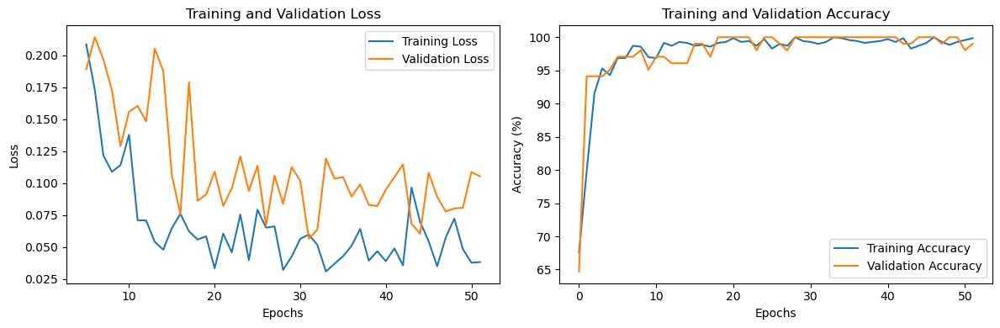

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8251501236312258
[[180   4]
 [  1  13]]
##################################### Iteration  6 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5798685923218727, Training Accuracy: 70.57142857142857%, Avg. Validation Loss: 0.3465347843510764, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.39893448826941574, Training Accuracy: 87.0%, Avg. Validation Loss: 0.1823866782443864, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2786041640422561, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.12998852080532483, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.19387245550751686, Training Accuracy: 97.28571428571429%, Avg. Validation Loss: 0.13732650130987167, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1952708153

Epoch [41/10000], Avg. Training Loss: 0.058708322594280944, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.08695920610002109, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.07427415971390226, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.07980951720050403, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


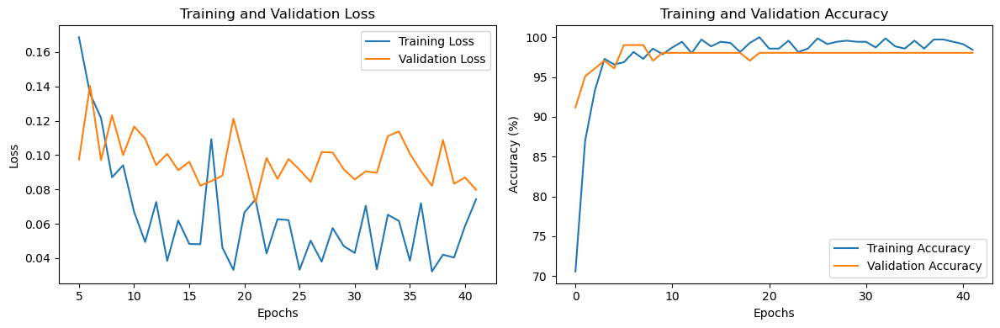

Accuracy of the network on the test set: 99.4949494949495 %, kappa: 0.9602569249297471
[[184   0]
 [  1  13]]
##################################### Iteration  7 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7205425785346464, Training Accuracy: 55.57142857142857%, Avg. Validation Loss: 0.4744933119841984, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5109302821484479, Training Accuracy: 76.14285714285714%, Avg. Validation Loss: 0.31480529052870615, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.36125859685919504, Training Accuracy: 89.14285714285714%, Avg. Validation Loss: 0.22273533259119307, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24947816167365422, Training Accuracy: 95.42857142857143%, Avg. Validation Loss: 0.24465349529470717, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

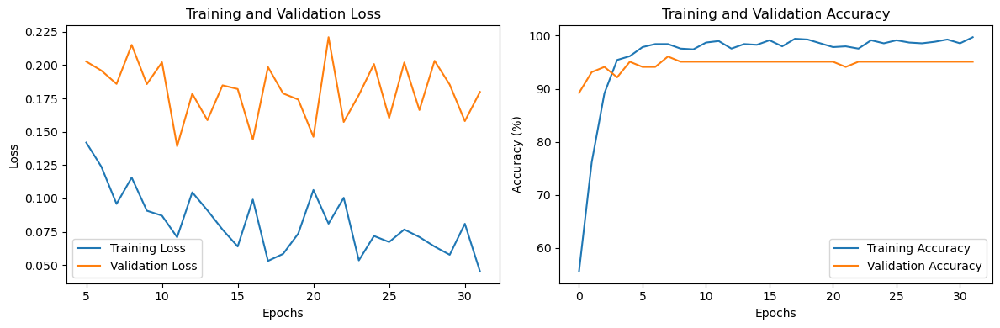

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8557902403495994
[[181   3]
 [  1  13]]
##################################### Iteration  8 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5804567458954725, Training Accuracy: 70.0%, Avg. Validation Loss: 0.44671142527035307, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4158490753986619, Training Accuracy: 88.28571428571429%, Avg. Validation Loss: 0.3401722439697811, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3349565728144212, Training Accuracy: 92.42857142857143%, Avg. Validation Loss: 0.279056225504194, Validation Accuracy: 97.05882352941177%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2827098566022786, Training Accuracy: 93.42857142857143%, Avg. Validation Loss: 0.21924908884934016, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2114869660951

Epoch [41/10000], Avg. Training Loss: 0.035398414231498136, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.12914245149918965, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [42/10000], Avg. Training Loss: 0.05808046248487451, Training Accuracy: 99.0%, Avg. Validation Loss: 0.11402127678905215, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.044241753152825615, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.11745098339659828, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.056648435557938435, Training Accuracy: 99.0%, Avg. Validation Loss: 0.12170547140496117, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.04412211141210388, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.161

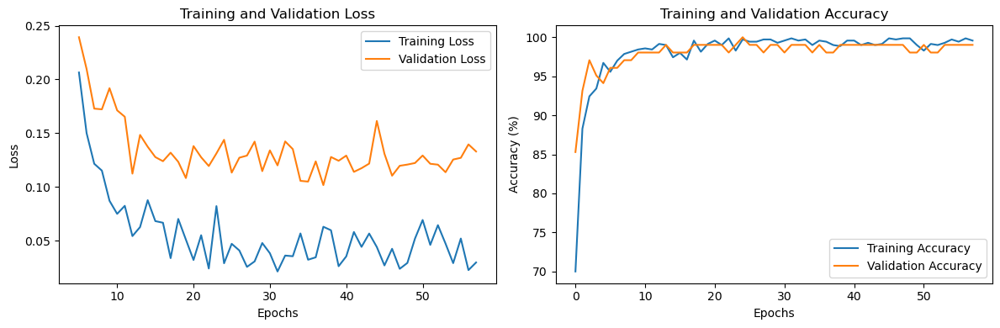

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.769076974341886
[[178   6]
 [  1  13]]
##################################### Iteration  9 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5801057774912227, Training Accuracy: 72.0%, Avg. Validation Loss: 0.419410194669451, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4559896764430133, Training Accuracy: 84.57142857142857%, Avg. Validation Loss: 0.27279798473630634, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.351934339851141, Training Accuracy: 94.14285714285714%, Avg. Validation Loss: 0.22703454537051065, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.27350637621500273, Training Accuracy: 95.85714285714286%, Avg. Validation Loss: 0.20599650804485595, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2081044834445

Epoch [40/10000], Avg. Training Loss: 0.08159451990980994, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.1897724994591304, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.07144452055746858, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.16908945249659674, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.07938610525293784, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.19293666630983353, Validation Accuracy: 94.11764705882354%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.08560241691090843, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.16862991558653967, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.08047918128696355, Training Accuracy: 99.0%, Avg. Validation Loss: 0.16631999239325523, Validation Accuracy: 95.0980392156862

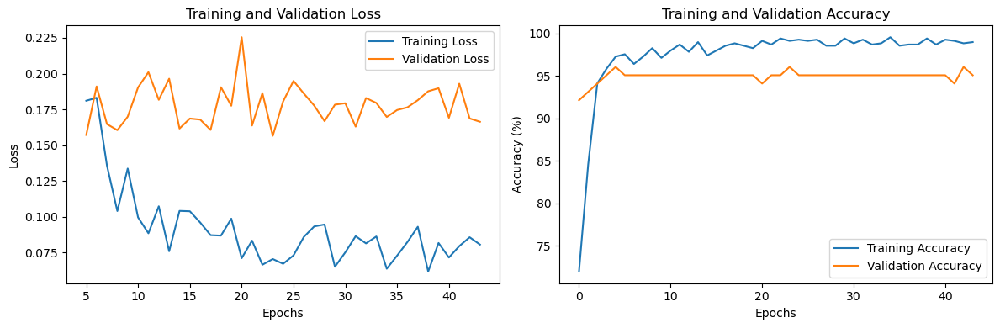

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8807707747892413
[[183   1]
 [  2  12]]
##################################### Iteration  10 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5317611335353418, Training Accuracy: 76.42857142857143%, Avg. Validation Loss: 0.4157659666878836, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4156100729649717, Training Accuracy: 86.71428571428571%, Avg. Validation Loss: 0.28684548820768085, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.292759699577635, Training Accuracy: 93.14285714285714%, Avg. Validation Loss: 0.3437527631010328, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24913915924050592, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.2823105262858527, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

Epoch [41/10000], Avg. Training Loss: 0.04684223780747165, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.14593062017645156, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch [42/10000], Avg. Training Loss: 0.04413989241319624, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.17229951066630228, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.03803542832081968, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.1554256177374295, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.05717973969876766, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.155103899538517, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.04589802014048804, Training Accuracy: 99.42857142857143%, Avg. Va

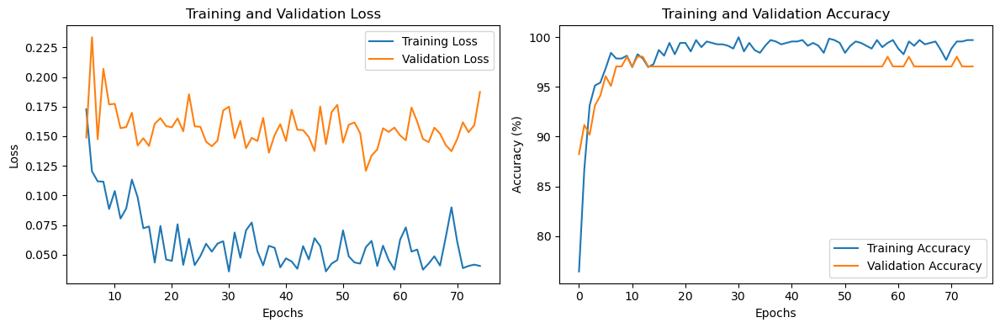

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8883878241262684
[[182   2]
 [  1  13]]
##################################### Iteration  11 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8846649486910213, Training Accuracy: 38.0%, Avg. Validation Loss: 0.29556342320782797, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5963397324085236, Training Accuracy: 68.85714285714286%, Avg. Validation Loss: 0.24257934306349074, Validation Accuracy: 97.05882352941177%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4519418701529503, Training Accuracy: 90.28571428571429%, Avg. Validation Loss: 0.16801158338785172, Validation Accuracy: 99.01960784313725%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.400454831732945, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.16663344310862677, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.3451568728

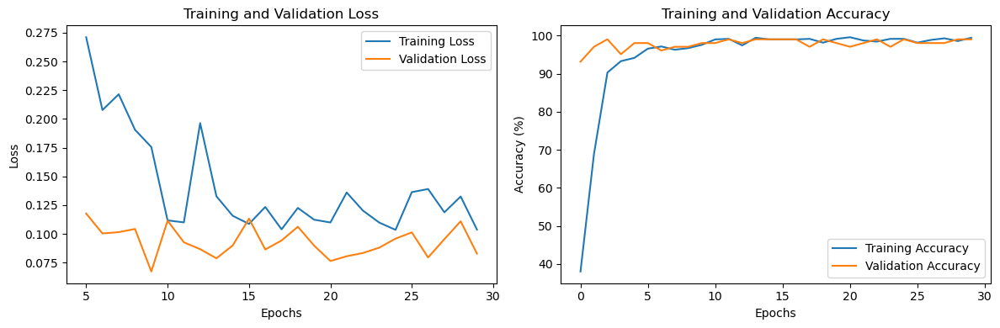

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7962962962962963
[[179   5]
 [  1  13]]
##################################### Iteration  12 #####################################
Epoch [1/10000], Avg. Training Loss: 0.691360894929279, Training Accuracy: 61.42857142857143%, Avg. Validation Loss: 0.32027794633592876, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.45316132632168854, Training Accuracy: 81.85714285714286%, Avg. Validation Loss: 0.2270417298589434, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3687544715675441, Training Accuracy: 91.42857142857143%, Avg. Validation Loss: 0.15650374442338943, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2894199531186711, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.15651180488722666, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [41/10000], Avg. Training Loss: 0.09874179193072698, Training Accuracy: 98.14285714285714%, Avg. Validation Loss: 0.0978488911475454, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.060858230106532574, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.10864521243742534, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.06856648725542155, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.07073405331798963, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.08115398523990404, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.07620257884263992, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.04448123077269305, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.09104406780430249, Validation Accuracy: 98

Epoch [81/10000], Avg. Training Loss: 0.05851428790695288, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.06988719371812684, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [82/10000], Avg. Training Loss: 0.05766126538880847, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.07173729208963257, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


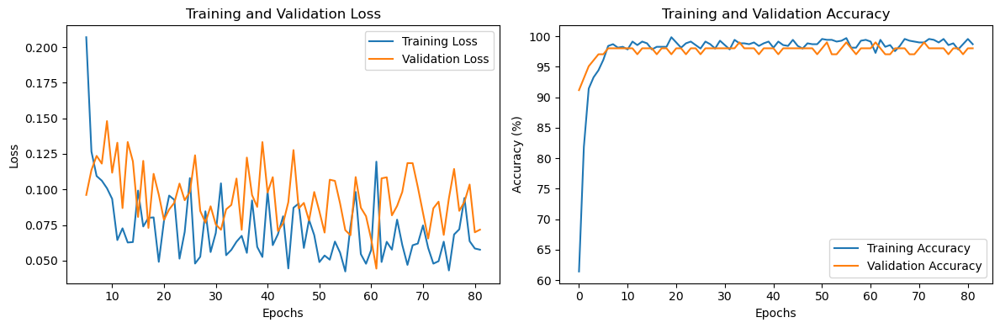

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8807707747892413
[[183   1]
 [  2  12]]
##################################### Iteration  13 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7517010474746878, Training Accuracy: 48.57142857142857%, Avg. Validation Loss: 0.4879141322204045, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6063749898563732, Training Accuracy: 69.28571428571429%, Avg. Validation Loss: 0.2612909014735903, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4330665909431197, Training Accuracy: 86.28571428571429%, Avg. Validation Loss: 0.19845446944236755, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3227341408756646, Training Accuracy: 95.0%, Avg. Validation Loss: 0.223233839230878, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.30273245918479

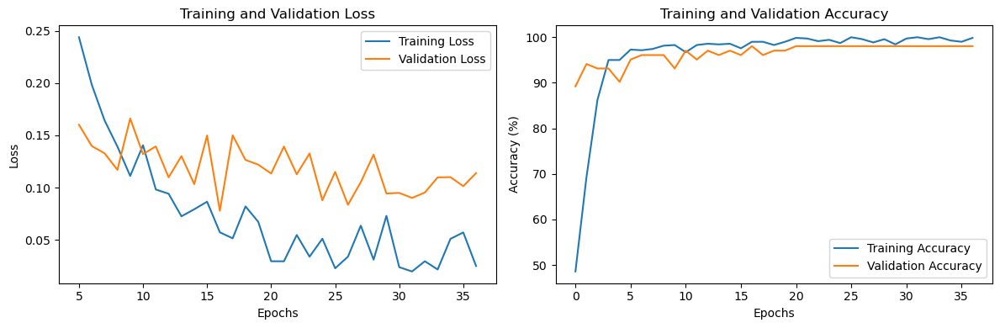

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.7014218009478672
[[182   2]
 [  5   9]]
##################################### Iteration  14 #####################################
Epoch [1/10000], Avg. Training Loss: 0.807245522737503, Training Accuracy: 43.142857142857146%, Avg. Validation Loss: 0.3740704783371517, Validation Accuracy: 90.19607843137256%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6469614309343424, Training Accuracy: 60.285714285714285%, Avg. Validation Loss: 0.2650160917213985, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4835034507242116, Training Accuracy: 83.14285714285714%, Avg. Validation Loss: 0.26005312161786215, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.41803131997585297, Training Accuracy: 91.71428571428571%, Avg. Validation Loss: 0.19558867386409215, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

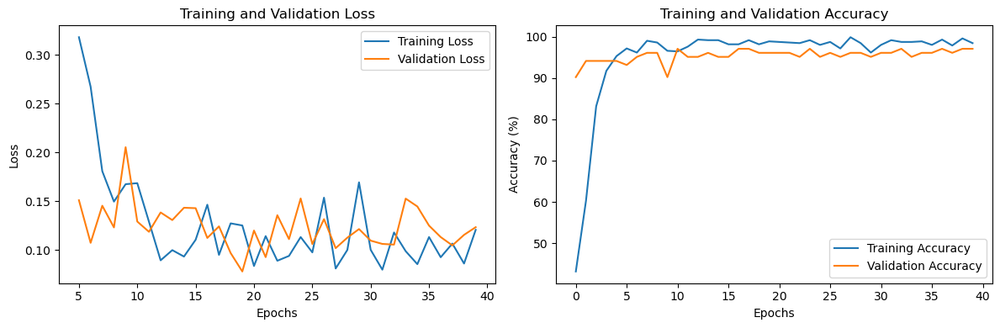

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7962962962962963
[[179   5]
 [  1  13]]
##################################### Iteration  15 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7720015943050385, Training Accuracy: 52.42857142857143%, Avg. Validation Loss: 0.368938752583095, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5315317186442289, Training Accuracy: 75.14285714285714%, Avg. Validation Loss: 0.29396860727242063, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.34644190526821395, Training Accuracy: 91.0%, Avg. Validation Loss: 0.295396442924227, Validation Accuracy: 88.23529411764706%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.27847249738194724, Training Accuracy: 95.85714285714286%, Avg. Validation Loss: 0.22200431994029454, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.209374772046

Epoch [41/10000], Avg. Training Loss: 0.057711625810373916, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.10411677935293742, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.06070922954346646, Training Accuracy: 99.0%, Avg. Validation Loss: 0.08885738785777773, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.1573429907756773, Training Accuracy: 97.0%, Avg. Validation Loss: 0.04433564256344523, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.054872332818128845, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.08133033609816007, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.09334317374635827, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.0645792478961604, Validation Accuracy: 98.03921568627452%, lr: 1.00

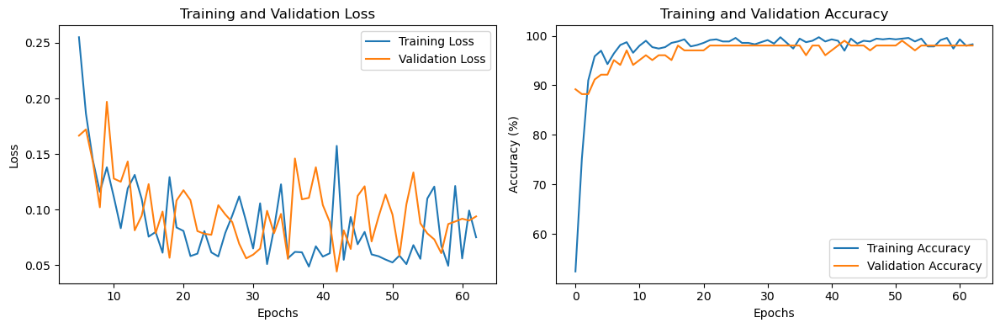

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7962962962962963
[[179   5]
 [  1  13]]
##################################### Iteration  16 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7086024819449945, Training Accuracy: 63.714285714285715%, Avg. Validation Loss: 0.4883196609360831, Validation Accuracy: 75.49019607843137%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4752294678579677, Training Accuracy: 83.42857142857143%, Avg. Validation Loss: 0.2926551912512098, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3344585475596515, Training Accuracy: 93.71428571428571%, Avg. Validation Loss: 0.3145982580525534, Validation Accuracy: 87.25490196078431%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.29318864474242384, Training Accuracy: 96.0%, Avg. Validation Loss: 0.2209053976195199, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.21112721548

Epoch [41/10000], Avg. Training Loss: 0.09321669916707007, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.14493462230478013, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.08618730310858651, Training Accuracy: 99.0%, Avg. Validation Loss: 0.15138344200594084, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.07444816696542231, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.15423661417194776, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.09377021867443215, Training Accuracy: 98.0%, Avg. Validation Loss: 0.14018816873431206, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.05051862486553463, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.15940183720418385, Validation Accuracy: 95.09803921568627%, lr: 1.00

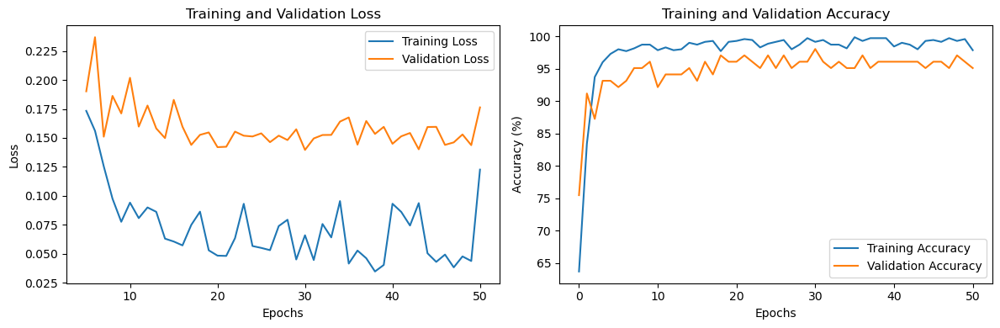

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  17 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6236671602184122, Training Accuracy: 65.42857142857143%, Avg. Validation Loss: 0.4080813484532492, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.46015853502533655, Training Accuracy: 83.14285714285714%, Avg. Validation Loss: 0.2692851126194, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3382854631001299, Training Accuracy: 94.14285714285714%, Avg. Validation Loss: 0.24771439390523092, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.26705174859274516, Training Accuracy: 96.85714285714286%, Avg. Validation Loss: 0.186654554946082, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2

Epoch [41/10000], Avg. Training Loss: 0.05935899180952798, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.1356074091579233, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.040467307310212745, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.14594944353614533, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


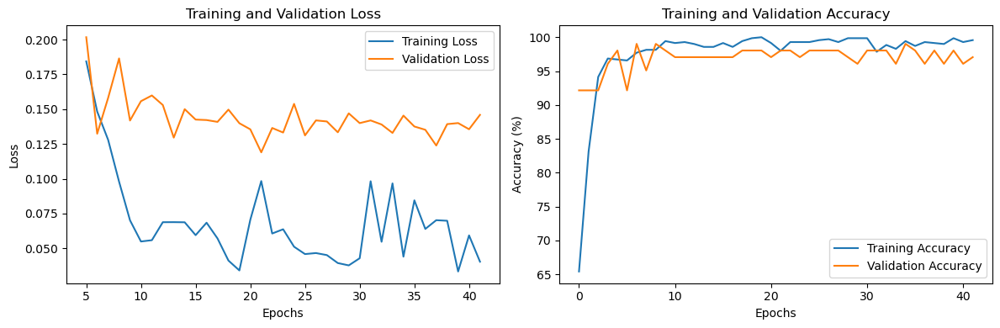

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8350549816727757
[[179   5]
 [  0  14]]
##################################### Iteration  18 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6065560660578988, Training Accuracy: 67.28571428571429%, Avg. Validation Loss: 0.5823341182300023, Validation Accuracy: 73.52941176470588%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.46924077516252344, Training Accuracy: 81.14285714285714%, Avg. Validation Loss: 0.41094474281583515, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3372722342610359, Training Accuracy: 92.71428571428571%, Avg. Validation Loss: 0.31313524714538027, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24531190097332, Training Accuracy: 97.42857142857143%, Avg. Validation Loss: 0.24988750900541032, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

Epoch [42/10000], Avg. Training Loss: 0.023033100391992113, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.12095269826906067, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch [43/10000], Avg. Training Loss: 0.05724996923130344, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.10482452863029071, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch 00039: reducing learning rate of group 0 to 1.0000e-08.
Epoch [44/10000], Avg. Training Loss: 0.021940887228331783, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.1196878334241254, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.06179370069664649, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.09490934147366456, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.06859620192765513, Training Accuracy: 98.42857142857143%, Avg

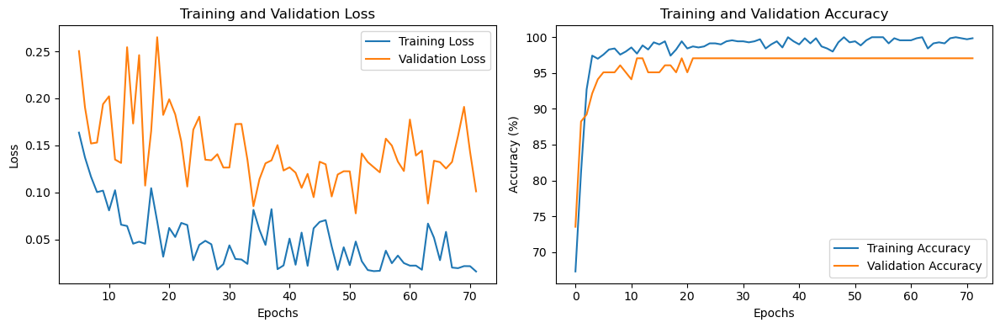

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7531172069825437
[[182   2]
 [  4  10]]
##################################### Iteration  19 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6082936186682094, Training Accuracy: 66.71428571428571%, Avg. Validation Loss: 0.3446469562394278, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3946516595103524, Training Accuracy: 85.42857142857143%, Avg. Validation Loss: 0.19249418377876282, Validation Accuracy: 98.03921568627452%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.30439055067571724, Training Accuracy: 91.71428571428571%, Avg. Validation Loss: 0.12424968608788081, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23391993987289342, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.18543953129223414, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

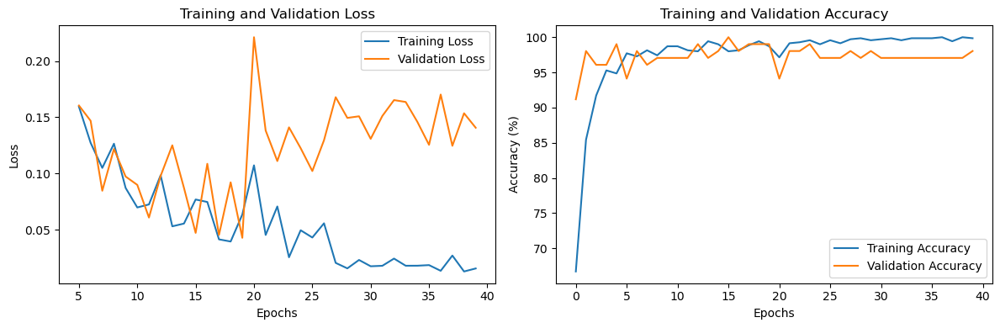

Accuracy of the network on the test set: 99.4949494949495 %, kappa: 0.9627959413754228
[[183   1]
 [  0  14]]
##################################### Iteration  20 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8961485055359927, Training Accuracy: 46.57142857142857%, Avg. Validation Loss: 0.33546667865344454, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6536286690018394, Training Accuracy: 66.42857142857143%, Avg. Validation Loss: 0.20956993315901076, Validation Accuracy: 96.07843137254902%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.37867211482741614, Training Accuracy: 89.14285714285714%, Avg. Validation Loss: 0.143261584852423, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.39389986815777694, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.13533230179122516, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

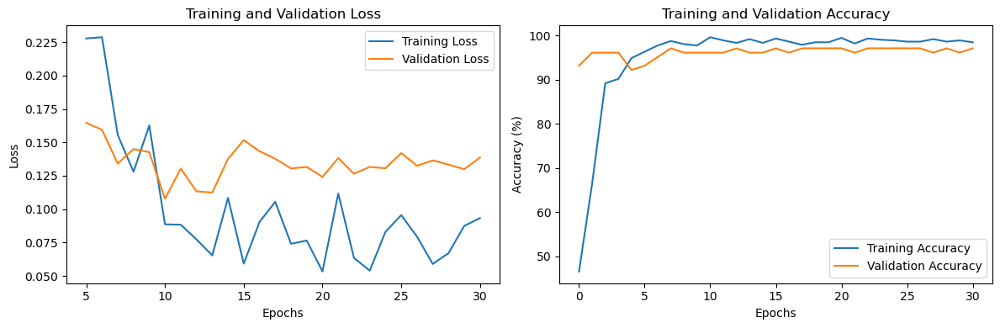

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.7395715896279594
[[180   4]
 [  3  11]]
##################################### Iteration  21 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7266459817236121, Training Accuracy: 57.0%, Avg. Validation Loss: 0.30966712534427643, Validation Accuracy: 95.09803921568627%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5452728142792528, Training Accuracy: 73.42857142857143%, Avg. Validation Loss: 0.19831663689443044, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.42946919934316113, Training Accuracy: 87.85714285714286%, Avg. Validation Loss: 0.14501780697277614, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3167238936505534, Training Accuracy: 94.57142857142857%, Avg. Validation Loss: 0.17680088430643082, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.23617243

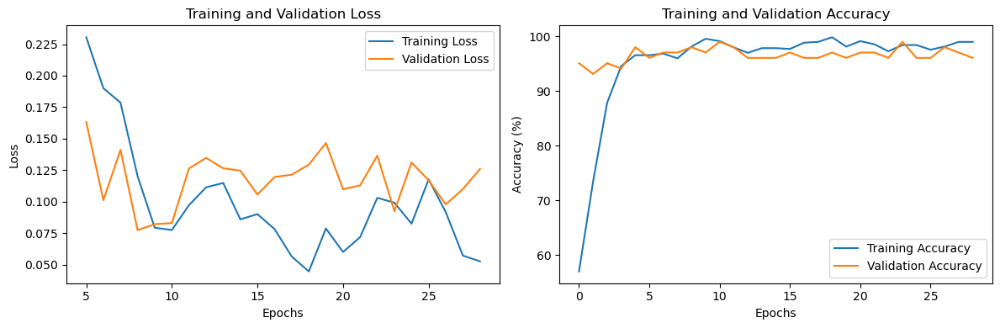

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8641975308641976
[[180   4]
 [  0  14]]
##################################### Iteration  22 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6002004099163142, Training Accuracy: 70.0%, Avg. Validation Loss: 0.6478098545755658, Validation Accuracy: 48.03921568627451%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.45600397884845734, Training Accuracy: 86.71428571428571%, Avg. Validation Loss: 0.5102396522249494, Validation Accuracy: 78.43137254901961%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3742050345648419, Training Accuracy: 92.85714285714286%, Avg. Validation Loss: 0.39677279336111887, Validation Accuracy: 86.27450980392157%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.30029891668395564, Training Accuracy: 96.28571428571429%, Avg. Validation Loss: 0.4062107673713139, Validation Accuracy: 85.29411764705883%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2415449107

Epoch [40/10000], Avg. Training Loss: 0.0809002471241084, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.1721695943602494, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.05746802552179857, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.25178029175315586, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.05666996089910919, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.20987417974642344, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.049785120751370086, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.24640665629080363, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.06693328002637083, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.24019701140267508, Validation Accuracy: 95.

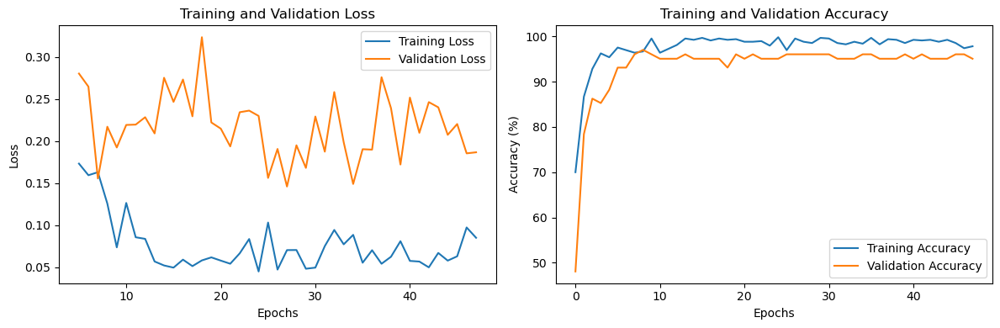

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9231366459627329
[[183   1]
 [  1  13]]
##################################### Iteration  23 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7043072594837709, Training Accuracy: 56.714285714285715%, Avg. Validation Loss: 0.37050279123442514, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.47741577435623517, Training Accuracy: 80.57142857142857%, Avg. Validation Loss: 0.2348050730569022, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.349023273722692, Training Accuracy: 91.42857142857143%, Avg. Validation Loss: 0.21596652375800268, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.28850617564537306, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.1815126868230956, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

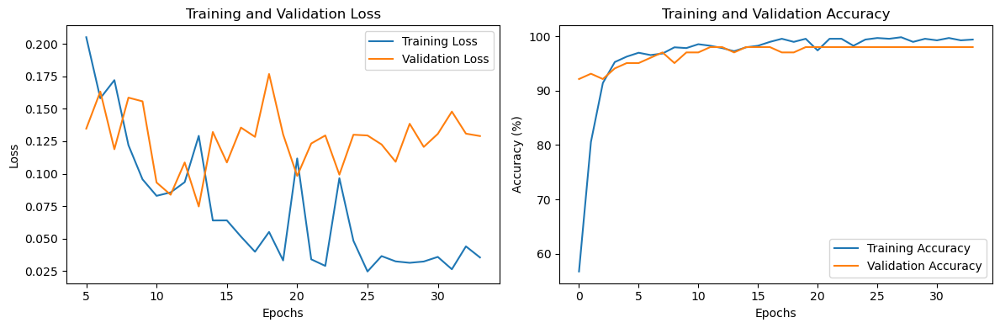

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8350549816727757
[[179   5]
 [  0  14]]
##################################### Iteration  24 #####################################
Epoch [1/10000], Avg. Training Loss: 0.812682946974581, Training Accuracy: 45.142857142857146%, Avg. Validation Loss: 0.3144118956157139, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5962014733390375, Training Accuracy: 69.57142857142857%, Avg. Validation Loss: 0.20209767669439316, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.45579043233936484, Training Accuracy: 88.14285714285714%, Avg. Validation Loss: 0.16034637444785663, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.33145131035284564, Training Accuracy: 93.85714285714286%, Avg. Validation Loss: 0.11586603043334824, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

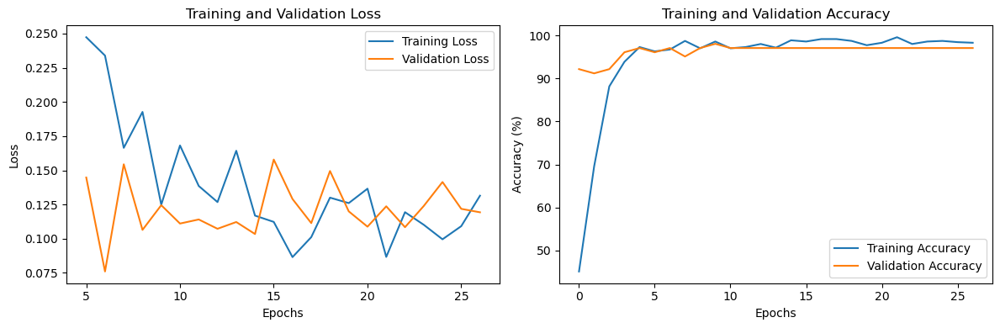

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8354114713216958
[[183   1]
 [  3  11]]
##################################### Iteration  25 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5047583715482191, Training Accuracy: 75.85714285714286%, Avg. Validation Loss: 0.561087680714471, Validation Accuracy: 77.45098039215686%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3285119760442864, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.3233824670314789, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2365514121272347, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.29828242531844545, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.201067099517042, Training Accuracy: 94.85714285714286%, Avg. Validation Loss: 0.2912166863679886, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1

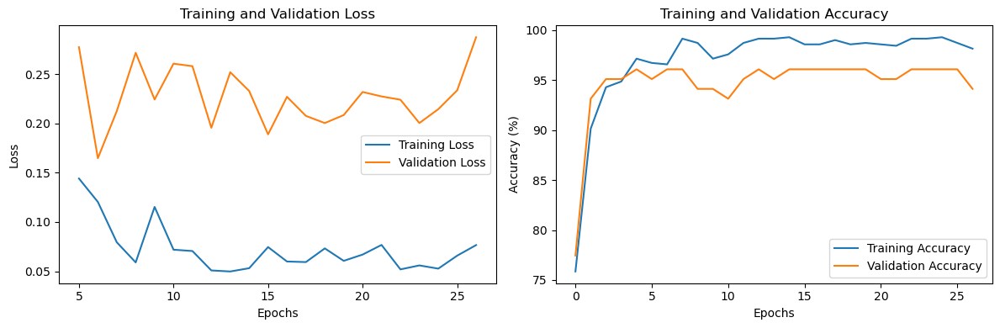

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.755210173083716
[[179   5]
 [  2  12]]
##################################### Iteration  26 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6680853590369225, Training Accuracy: 60.0%, Avg. Validation Loss: 0.49700196725981577, Validation Accuracy: 80.3921568627451%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4627508277242834, Training Accuracy: 82.85714285714286%, Avg. Validation Loss: 0.252941621201379, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3016729981384494, Training Accuracy: 94.14285714285714%, Avg. Validation Loss: 0.26908921769687105, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.27767323499376123, Training Accuracy: 94.85714285714286%, Avg. Validation Loss: 0.1499248892068863, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1957972781224

Epoch [43/10000], Avg. Training Loss: 0.03903525456024164, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.08697798688496862, Validation Accuracy: 100.0%, lr: 1.0000000000000002e-07
Epoch 00039: reducing learning rate of group 0 to 1.0000e-08.
Epoch [44/10000], Avg. Training Loss: 0.03530543018132448, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.08867006057075091, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.05445782052861019, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.05609318933316639, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.029099125034091147, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.08290565173540797, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [47/10000], Avg. Training Loss: 0.02626338319598951, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.09553117837224688, Validati

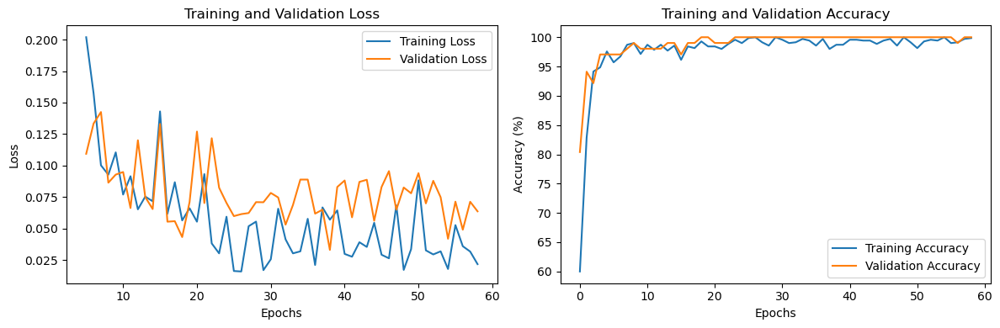

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8139797068771139
[[181   3]
 [  2  12]]
##################################### Iteration  27 #####################################
Epoch [1/10000], Avg. Training Loss: 0.714853512969884, Training Accuracy: 56.42857142857143%, Avg. Validation Loss: 0.46045651180403574, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5088177546858788, Training Accuracy: 74.71428571428571%, Avg. Validation Loss: 0.2824436660323824, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.38262044977058063, Training Accuracy: 88.28571428571429%, Avg. Validation Loss: 0.22357745894363948, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2738301252776926, Training Accuracy: 94.0%, Avg. Validation Loss: 0.21411392731325968, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.19359281184

Epoch [42/10000], Avg. Training Loss: 0.029528905531730164, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.10742567160299846, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.03848509441807189, Training Accuracy: 99.0%, Avg. Validation Loss: 0.10821001657417842, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.03373402579348873, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.0957328315292086, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.04089095511219718, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.12157781847885676, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.06174981985664503, Training Accuracy: 98.85714285714286%, Avg. Validation L

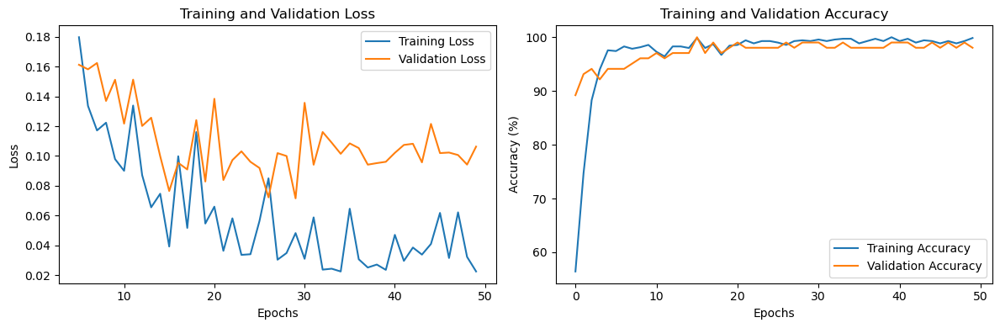

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7694099378881988
[[181   3]
 [  3  11]]
##################################### Iteration  28 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6407567709684372, Training Accuracy: 62.857142857142854%, Avg. Validation Loss: 0.426621675491333, Validation Accuracy: 90.19607843137256%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.47924265400929883, Training Accuracy: 81.14285714285714%, Avg. Validation Loss: 0.25765023274081095, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.367109091444449, Training Accuracy: 91.14285714285714%, Avg. Validation Loss: 0.21783096023968287, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2966655861924995, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.1678202130964824, Validation Accuracy: 98.03921568627452%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

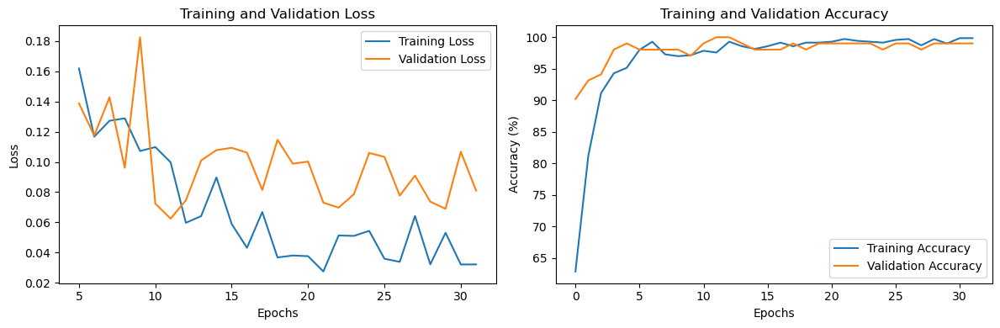

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8012846246487355
[[182   2]
 [  3  11]]
##################################### Iteration  29 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7741330943324349, Training Accuracy: 52.0%, Avg. Validation Loss: 0.31501454540661405, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.546974087303335, Training Accuracy: 73.14285714285714%, Avg. Validation Loss: 0.19864296913146973, Validation Accuracy: 96.07843137254902%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.42932381040670653, Training Accuracy: 89.57142857142857%, Avg. Validation Loss: 0.24998531384127481, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.30953889272429724, Training Accuracy: 94.14285714285714%, Avg. Validation Loss: 0.16787719194378173, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.26127582

Epoch [41/10000], Avg. Training Loss: 0.02812238094735552, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.07033318121518407, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch [42/10000], Avg. Training Loss: 0.053891352504830466, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.0681707997407232, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.05400546625341204, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.05478745752147266, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.023787893164394933, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.06362956815532275, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.04039024028249762, Training Accuracy: 99.28571428571429%, Avg

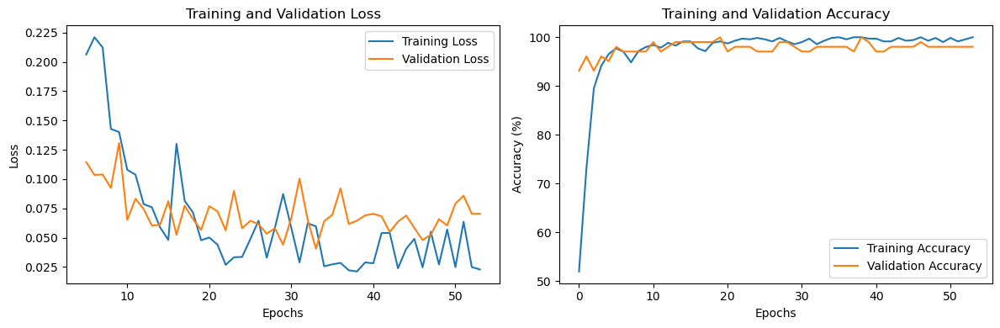

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9231366459627329
[[183   1]
 [  1  13]]
##################################### Iteration  30 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7865453890778802, Training Accuracy: 55.857142857142854%, Avg. Validation Loss: 0.516472339630127, Validation Accuracy: 76.47058823529412%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5289738415317102, Training Accuracy: 78.42857142857143%, Avg. Validation Loss: 0.2736662988151823, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.40208055383779784, Training Accuracy: 88.14285714285714%, Avg. Validation Loss: 0.24460652896336146, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.25479364716871217, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.23145924508571625, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [40/10000], Avg. Training Loss: 0.0900212471712042, Training Accuracy: 98.14285714285714%, Avg. Validation Loss: 0.1362074243703059, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.05479166656732559, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.17785350499408586, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.049154504435136914, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.1304139353867088, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.049666002435101705, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.14715689793229103, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.05323256564919244, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.14139032550156116, Validation Accuracy: 96.

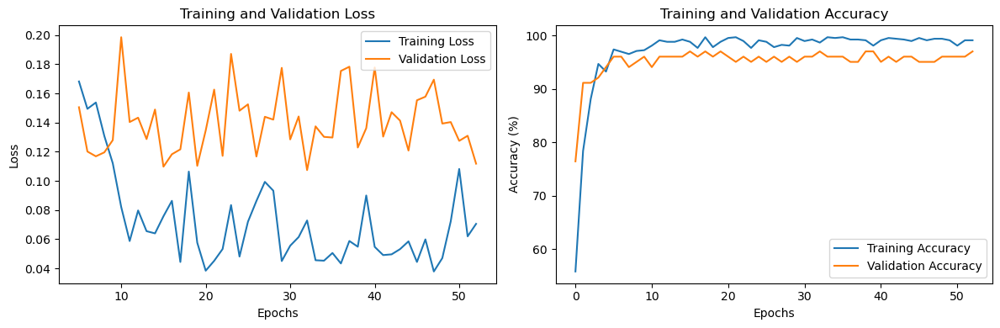

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8557902403495994
[[181   3]
 [  1  13]]
##################################### Iteration  31 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6807917234572497, Training Accuracy: 57.0%, Avg. Validation Loss: 0.4112157012735094, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.46481601284308866, Training Accuracy: 83.28571428571429%, Avg. Validation Loss: 0.26890442626816885, Validation Accuracy: 85.29411764705883%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3518761264329607, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.2623295656272343, Validation Accuracy: 86.27450980392157%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.296822307462042, Training Accuracy: 95.71428571428571%, Avg. Validation Loss: 0.29187714202063425, Validation Accuracy: 82.3529411764706%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.265820836817

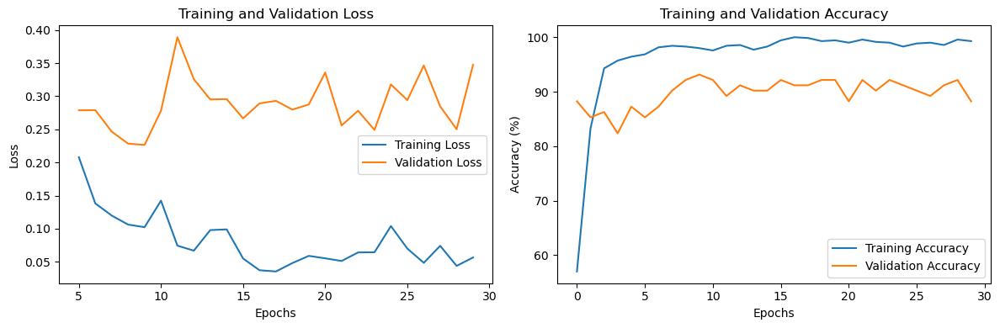

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8641975308641976
[[180   4]
 [  0  14]]
##################################### Iteration  32 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5007556798783216, Training Accuracy: 76.85714285714286%, Avg. Validation Loss: 0.69537353515625, Validation Accuracy: 58.8235294117647%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3263743208213286, Training Accuracy: 88.71428571428571%, Avg. Validation Loss: 0.39264015214783804, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.24304911849850958, Training Accuracy: 93.42857142857143%, Avg. Validation Loss: 0.30463792383670807, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.21458120915022763, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.25088675745895933, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

Epoch [42/10000], Avg. Training Loss: 0.020649616500701417, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.07151061030370849, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [43/10000], Avg. Training Loss: 0.04499091432345184, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.0885084154350417, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch 00039: reducing learning rate of group 0 to 1.0000e-08.
Epoch [44/10000], Avg. Training Loss: 0.0477911628973247, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.05751845719558852, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.042663145514035765, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.05885893212897437, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.03230483412996612, Training Accuracy: 99.14285714285714%, Avg.

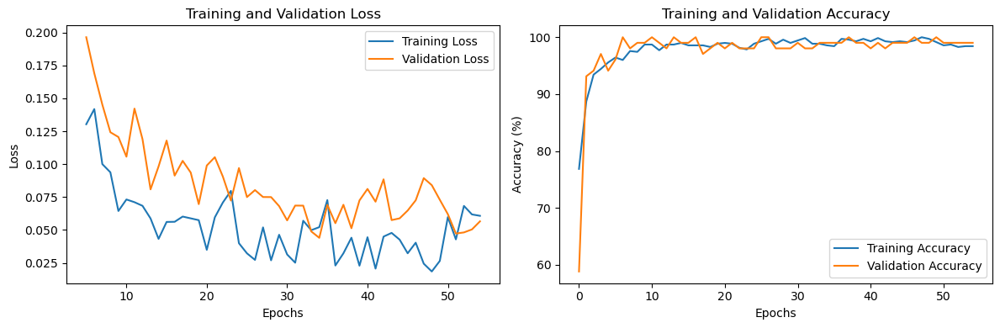

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7694099378881988
[[181   3]
 [  3  11]]
##################################### Iteration  33 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6120177432894707, Training Accuracy: 66.42857142857143%, Avg. Validation Loss: 0.6119525262287685, Validation Accuracy: 70.58823529411765%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.47889106517488306, Training Accuracy: 78.71428571428571%, Avg. Validation Loss: 0.41523600263254984, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3139333745295351, Training Accuracy: 89.57142857142857%, Avg. Validation Loss: 0.2289838045835495, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24848605726252904, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.3068950069802148, Validation Accuracy: 86.27450980392157%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

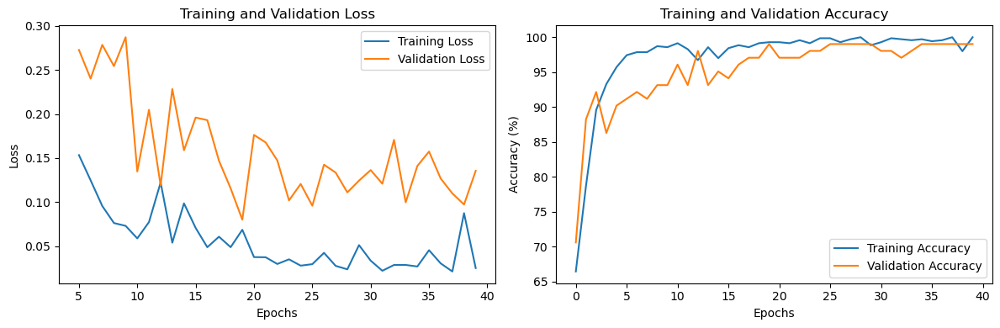

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7836853605243992
[[180   4]
 [  2  12]]
##################################### Iteration  34 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6297373134981502, Training Accuracy: 63.285714285714285%, Avg. Validation Loss: 0.4779486528464726, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4789466092532331, Training Accuracy: 84.57142857142857%, Avg. Validation Loss: 0.2471781224012375, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3438358449123122, Training Accuracy: 93.85714285714286%, Avg. Validation Loss: 0.24778938719204494, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.29452110589905217, Training Accuracy: 95.85714285714286%, Avg. Validation Loss: 0.18223180302551814, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [42/10000], Avg. Training Loss: 0.02299136835658415, Training Accuracy: 100.0%, Avg. Validation Loss: 0.09675374414239611, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.02462671354243701, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.1145030643258776, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.051415740977972746, Training Accuracy: 99.0%, Avg. Validation Loss: 0.07094657687204224, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.022661963922225616, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.0893132888845035, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.039539353477514604, Training Accuracy: 99.0%, Avg. Validation Loss: 0.09876010354076113

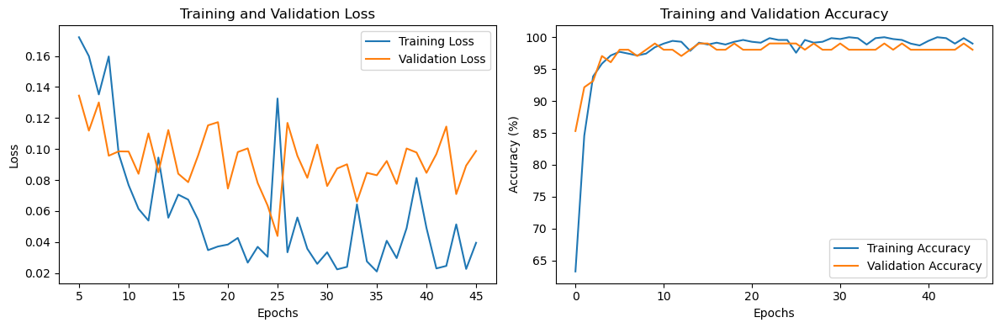

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8557902403495994
[[181   3]
 [  1  13]]
##################################### Iteration  35 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6483090845021334, Training Accuracy: 61.857142857142854%, Avg. Validation Loss: 0.43565970233508516, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.46391970867460425, Training Accuracy: 81.57142857142857%, Avg. Validation Loss: 0.3004162311553955, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.33612678945064545, Training Accuracy: 92.42857142857143%, Avg. Validation Loss: 0.21658548286982945, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.29864200814203784, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.15331526207072393, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training L

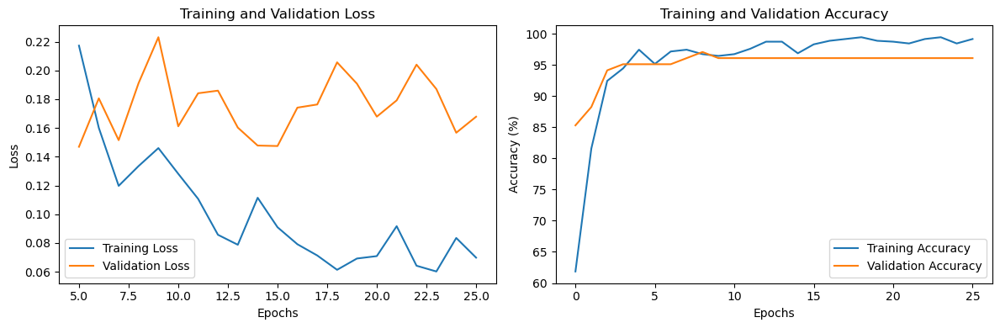

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8350549816727757
[[179   5]
 [  0  14]]
##################################### Iteration  36 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6751738095825369, Training Accuracy: 56.285714285714285%, Avg. Validation Loss: 0.34479883313179016, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.48396164856173773, Training Accuracy: 78.71428571428571%, Avg. Validation Loss: 0.26967948249408175, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.38188829814845865, Training Accuracy: 88.71428571428571%, Avg. Validation Loss: 0.2595431464059012, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.30260714143514633, Training Accuracy: 95.0%, Avg. Validation Loss: 0.2715120571000235, Validation Accuracy: 90.19607843137256%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2486498

Epoch [41/10000], Avg. Training Loss: 0.07724854663353074, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.09892544416444642, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.07065953648733822, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.13115943329674856, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.06808875488456, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.12187290298087257, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.05275125484066931, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.10603075314845357, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.0814063201065768, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.056191811870251386, Validation Accuracy: 98.03

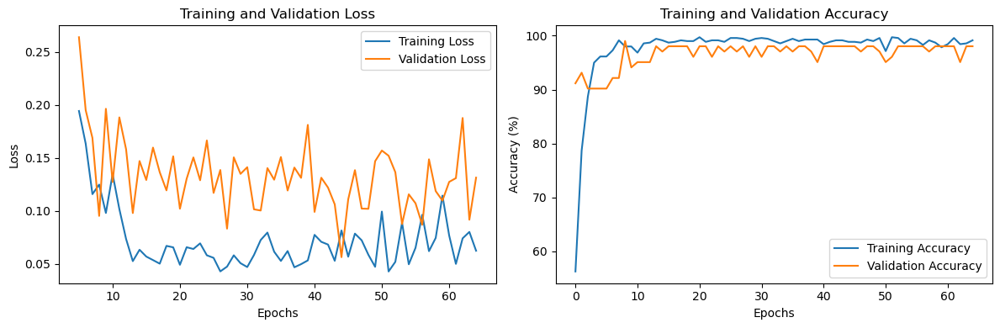

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7836853605243992
[[180   4]
 [  2  12]]
##################################### Iteration  37 #####################################
Epoch [1/10000], Avg. Training Loss: 0.666440608149225, Training Accuracy: 57.42857142857143%, Avg. Validation Loss: 0.4371289312839508, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5096711665391922, Training Accuracy: 76.28571428571429%, Avg. Validation Loss: 0.37161824107170105, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3972612517801198, Training Accuracy: 88.14285714285714%, Avg. Validation Loss: 0.3597652571541922, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.33856808055530896, Training Accuracy: 92.14285714285714%, Avg. Validation Loss: 0.2033045632498605, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

Epoch [40/10000], Avg. Training Loss: 0.06585548318583857, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.1426296361855098, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


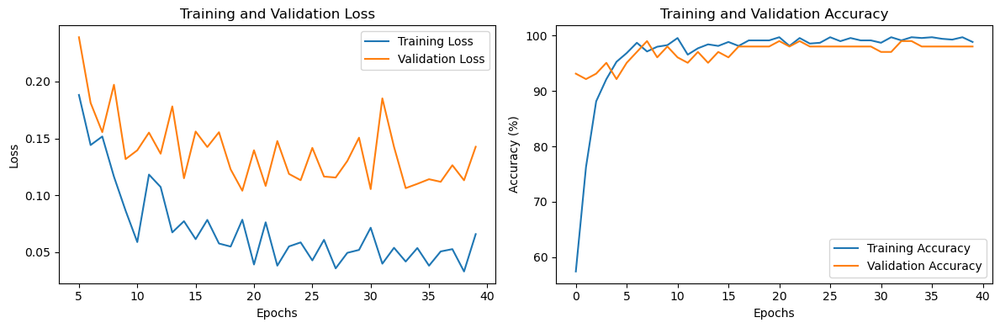

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8950900741787354
[[181   3]
 [  0  14]]
##################################### Iteration  38 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5160903097553686, Training Accuracy: 76.28571428571429%, Avg. Validation Loss: 0.44163025277001516, Validation Accuracy: 90.19607843137256%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3657905330712145, Training Accuracy: 87.0%, Avg. Validation Loss: 0.2577872063432421, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.26809126274152234, Training Accuracy: 94.57142857142857%, Avg. Validation Loss: 0.20657425693103246, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.19325029240413147, Training Accuracy: 96.57142857142857%, Avg. Validation Loss: 0.19379003558840072, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.17300858

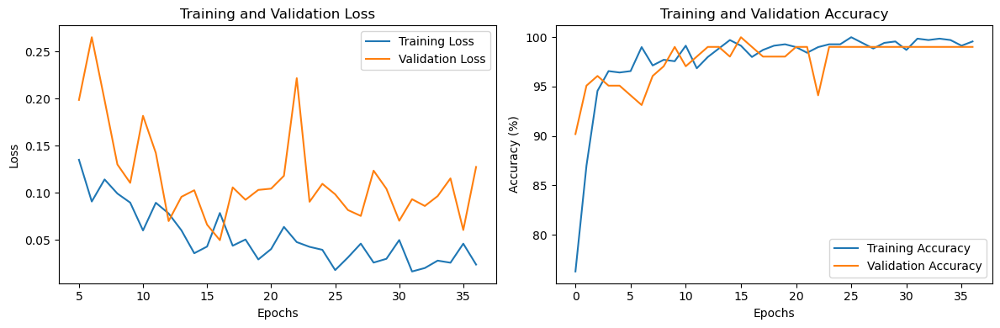

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7836853605243992
[[180   4]
 [  2  12]]
##################################### Iteration  39 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7909394252029333, Training Accuracy: 54.714285714285715%, Avg. Validation Loss: 0.349018326827458, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5655929094011133, Training Accuracy: 71.28571428571429%, Avg. Validation Loss: 0.18990580098969595, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3677134286950935, Training Accuracy: 89.71428571428571%, Avg. Validation Loss: 0.14167239463755063, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.307374642315236, Training Accuracy: 93.0%, Avg. Validation Loss: 0.1451870064650263, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.226802852851

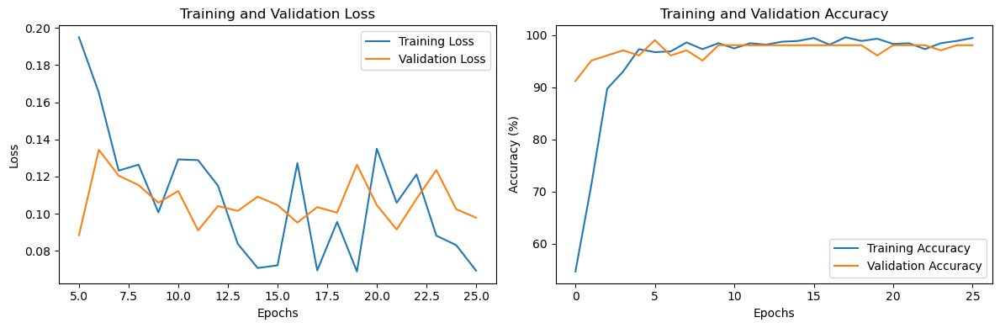

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8354114713216958
[[183   1]
 [  3  11]]
##################################### Iteration  40 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6769747971133753, Training Accuracy: 56.57142857142857%, Avg. Validation Loss: 0.44733984981264385, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4945627105506984, Training Accuracy: 77.42857142857143%, Avg. Validation Loss: 0.2459940995488848, Validation Accuracy: 98.03921568627452%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.35690863024104724, Training Accuracy: 92.28571428571429%, Avg. Validation Loss: 0.28462845938546316, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.25346705419096077, Training Accuracy: 97.0%, Avg. Validation Loss: 0.29425105665411266, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.25181478

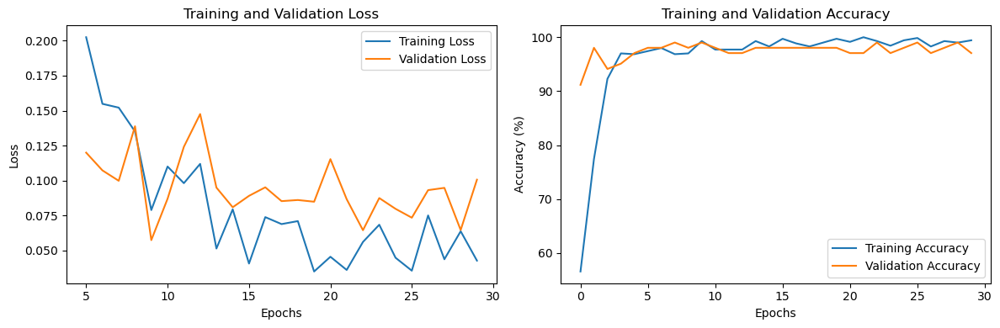

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7962962962962963
[[179   5]
 [  1  13]]
##################################### Iteration  41 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5400736237114127, Training Accuracy: 74.0%, Avg. Validation Loss: 0.6034621255738395, Validation Accuracy: 65.68627450980392%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4201045415618203, Training Accuracy: 83.0%, Avg. Validation Loss: 0.3589686793940408, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.278195607052608, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.2803006874663489, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.19829558885910295, Training Accuracy: 97.71428571428571%, Avg. Validation Loss: 0.2640927221093859, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.17193242484195667, Trainin

Epoch [42/10000], Avg. Training Loss: 0.0505900348176841, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.13378024527004787, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [43/10000], Avg. Training Loss: 0.027346680025485428, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.11580452642270497, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [44/10000], Avg. Training Loss: 0.026902640714648773, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.128013048853193, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [45/10000], Avg. Training Loss: 0.04076464436101643, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.10446252727082797, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch 00041: reducing learning rate of group 0 to 1.0000e-08.
Epoch [46/10000], Avg. Training Loss: 0.048158188202333724, Training Accuracy: 99.0%, Avg. Validation L

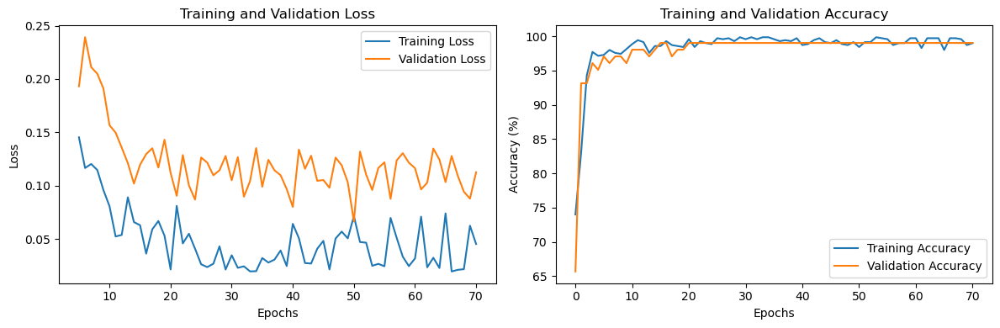

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8251501236312258
[[180   4]
 [  1  13]]
##################################### Iteration  42 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7234723507003351, Training Accuracy: 58.57142857142857%, Avg. Validation Loss: 0.6097074576786586, Validation Accuracy: 65.68627450980392%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.47835294563661923, Training Accuracy: 83.42857142857143%, Avg. Validation Loss: 0.2778275694165911, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.35438130084763875, Training Accuracy: 93.14285714285714%, Avg. Validation Loss: 0.21566705192838395, Validation Accuracy: 88.23529411764706%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.29560648040337995, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.20148189791611262, Validation Accuracy: 90.19607843137256%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

Epoch [41/10000], Avg. Training Loss: 0.06073364755138755, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.11816219320254666, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.04197331636466763, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.1785882424030985, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


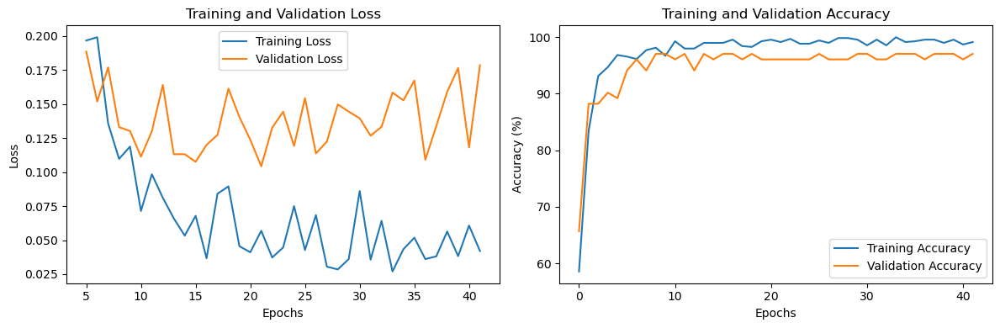

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.8075178224238496
[[178   6]
 [  0  14]]
##################################### Iteration  43 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5156508372588591, Training Accuracy: 75.42857142857143%, Avg. Validation Loss: 0.5364489427634648, Validation Accuracy: 78.43137254901961%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3452064635401422, Training Accuracy: 86.57142857142857%, Avg. Validation Loss: 0.37684880409921917, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.25695148516785016, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.22095459486757005, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.1809404676949436, Training Accuracy: 96.57142857142857%, Avg. Validation Loss: 0.26028075388499666, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

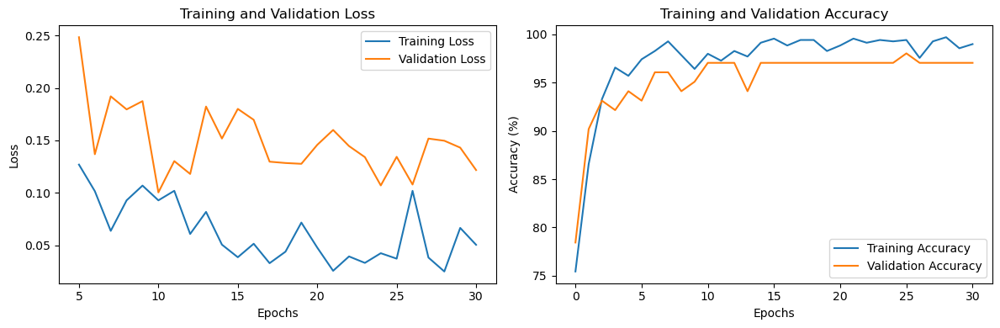

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7531172069825437
[[182   2]
 [  4  10]]
##################################### Iteration  44 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7512883252718232, Training Accuracy: 56.42857142857143%, Avg. Validation Loss: 0.4297190010547638, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.54600728912787, Training Accuracy: 75.85714285714286%, Avg. Validation Loss: 0.32251116207667757, Validation Accuracy: 96.07843137254902%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3324376679956913, Training Accuracy: 89.85714285714286%, Avg. Validation Loss: 0.3311129765851157, Validation Accuracy: 82.3529411764706%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23565157130360603, Training Accuracy: 94.57142857142857%, Avg. Validation Loss: 0.21226286462375096, Validation Accuracy: 89.2156862745098%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.16

Epoch [41/10000], Avg. Training Loss: 0.08176673169840466, Training Accuracy: 98.14285714285714%, Avg. Validation Loss: 0.1258948982826301, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.10016790697012436, Training Accuracy: 98.0%, Avg. Validation Loss: 0.13113304919430188, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.061173693065277555, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.1507803669997624, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07447236975316297, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.13246031637702668, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.07299954342571172, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.12186332951698985, Validation Accuracy: 97.0588235294117

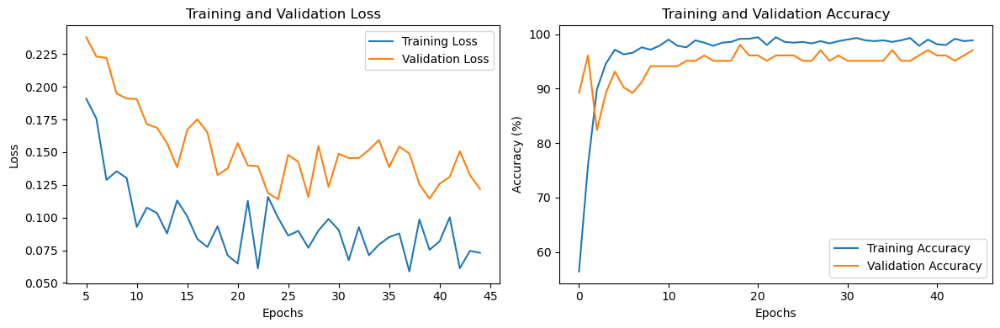

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8807707747892413
[[183   1]
 [  2  12]]
##################################### Iteration  45 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7467299896207723, Training Accuracy: 58.285714285714285%, Avg. Validation Loss: 0.427204076732908, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4559258415617726, Training Accuracy: 79.57142857142857%, Avg. Validation Loss: 0.31672571280172895, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3254276222803376, Training Accuracy: 89.71428571428571%, Avg. Validation Loss: 0.2754091577870505, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.25784154439514334, Training Accuracy: 95.57142857142857%, Avg. Validation Loss: 0.17991313657590322, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

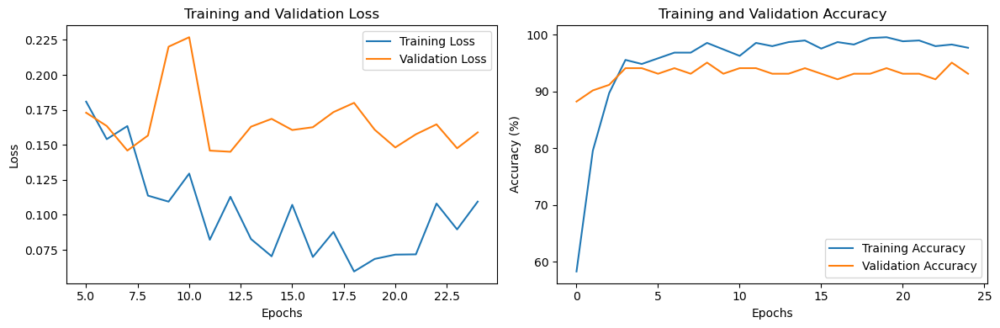

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.7190160832544938
[[176   8]
 [  1  13]]
##################################### Iteration  46 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5721526938405904, Training Accuracy: 70.42857142857143%, Avg. Validation Loss: 0.6907581516674587, Validation Accuracy: 58.8235294117647%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.385052773762833, Training Accuracy: 87.85714285714286%, Avg. Validation Loss: 0.4244131020137242, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2779419313777577, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.2458108929651124, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23991419645872983, Training Accuracy: 94.85714285714286%, Avg. Validation Loss: 0.26079653416361126, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

Epoch [41/10000], Avg. Training Loss: 0.05586948135698384, Training Accuracy: 99.0%, Avg. Validation Loss: 0.13834102558238165, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.06937022833153605, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.15309281008584158, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.0960695873522623, Training Accuracy: 97.71428571428571%, Avg. Validation Loss: 0.12649753157581603, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.04487415047531778, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.13567050972155162, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


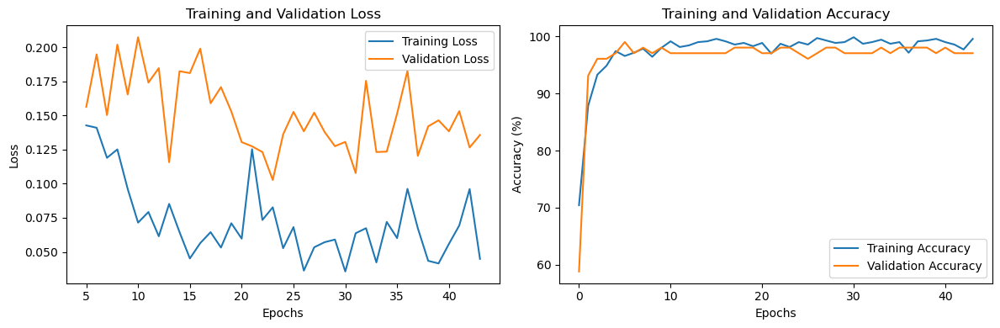

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7694099378881988
[[181   3]
 [  3  11]]
##################################### Iteration  47 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6905101158402183, Training Accuracy: 55.42857142857143%, Avg. Validation Loss: 0.5260229153292519, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5473236055536703, Training Accuracy: 73.14285714285714%, Avg. Validation Loss: 0.3714104379926409, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4128893349658359, Training Accuracy: 88.85714285714286%, Avg. Validation Loss: 0.2978025270359857, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3220347304913131, Training Accuracy: 93.85714285714286%, Avg. Validation Loss: 0.2274904421397618, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2

Epoch [42/10000], Avg. Training Loss: 0.04079226044599305, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.09078346991113254, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.066565676973286, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.059100352227687836, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.046812299892983654, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.0925474480858871, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


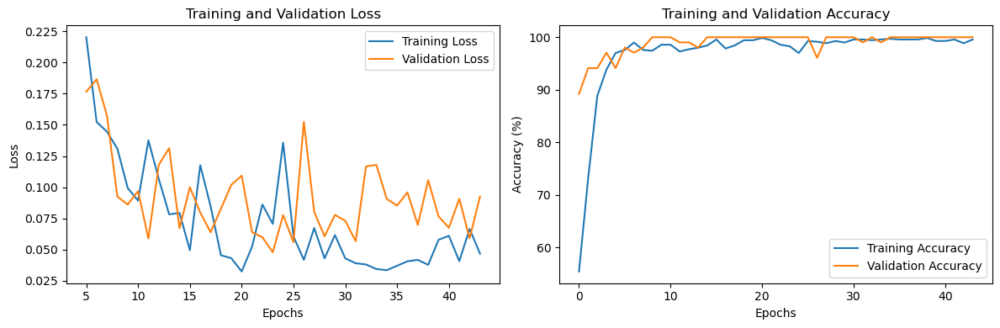

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.7030989670109964
[[177   7]
 [  2  12]]
##################################### Iteration  48 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5804387913508848, Training Accuracy: 68.28571428571429%, Avg. Validation Loss: 0.4998597630432674, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.43623689765279944, Training Accuracy: 83.42857142857143%, Avg. Validation Loss: 0.33346339421612875, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2911873805251988, Training Accuracy: 95.42857142857143%, Avg. Validation Loss: 0.2833967996495111, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24677223373543133, Training Accuracy: 95.85714285714286%, Avg. Validation Loss: 0.3024662733078003, Validation Accuracy: 89.2156862745098%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

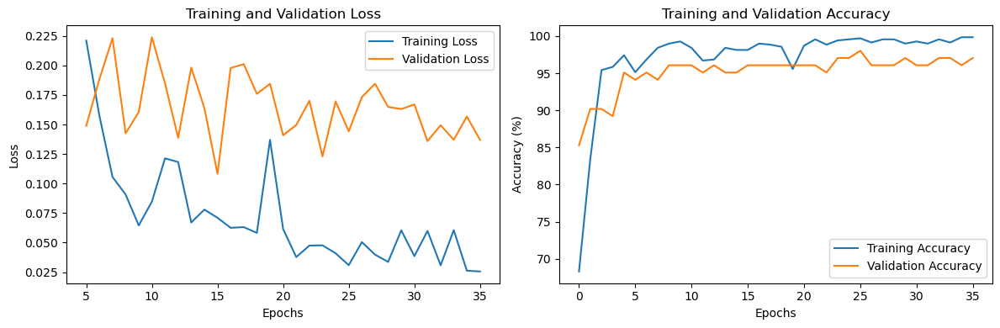

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8354114713216958
[[183   1]
 [  3  11]]
##################################### Iteration  49 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6682697250084444, Training Accuracy: 58.57142857142857%, Avg. Validation Loss: 0.410758444241115, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4669783399863677, Training Accuracy: 80.85714285714286%, Avg. Validation Loss: 0.27150816151074003, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3479305769909512, Training Accuracy: 92.0%, Avg. Validation Loss: 0.23836142037596023, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.26146883314306085, Training Accuracy: 96.14285714285714%, Avg. Validation Loss: 0.23380781710147858, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.24195933866

Epoch [41/10000], Avg. Training Loss: 0.054191721518608654, Training Accuracy: 99.0%, Avg. Validation Loss: 0.10972917984638896, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.0558112092231485, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.13799317393984115, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.07838199562816457, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.13466355417455947, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07049712822349234, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.1267395583646638, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.0787716222164983, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.13924588688782283, Validation Accuracy: 96.07843137254902

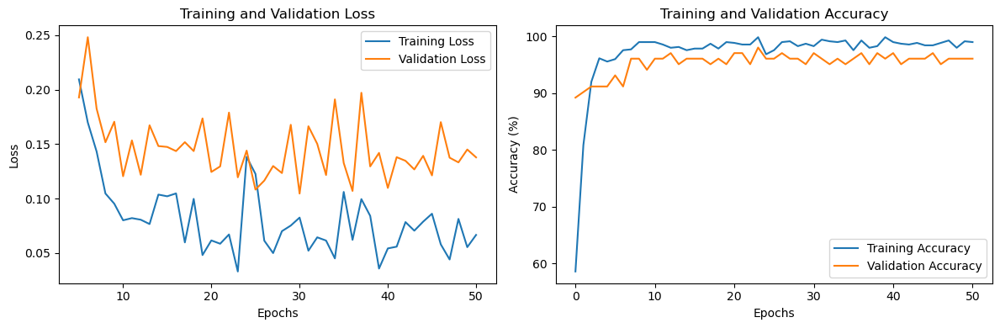

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8139797068771139
[[181   3]
 [  2  12]]
##################################### Iteration  50 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5285199575803496, Training Accuracy: 73.85714285714286%, Avg. Validation Loss: 0.618836692401341, Validation Accuracy: 70.58823529411765%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.34376297891139984, Training Accuracy: 87.71428571428571%, Avg. Validation Loss: 0.44358570660863605, Validation Accuracy: 83.33333333333333%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2749888195910237, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.32892124567713055, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22514109499752522, Training Accuracy: 93.71428571428571%, Avg. Validation Loss: 0.27300246911389486, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

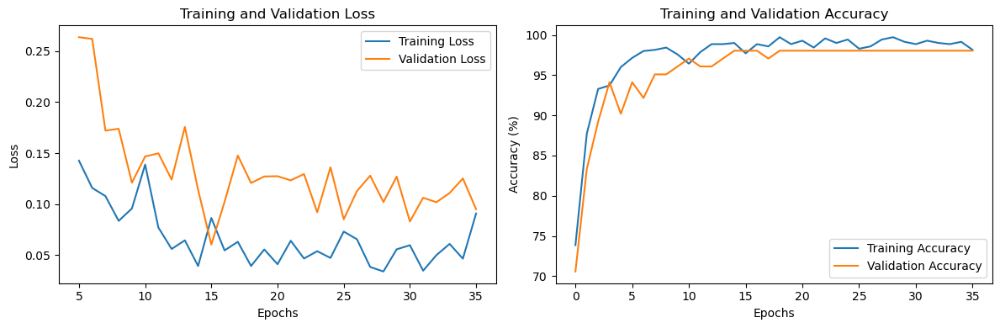

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8012846246487355
[[182   2]
 [  3  11]]
##################################### Iteration  51 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6590145934711803, Training Accuracy: 60.57142857142857%, Avg. Validation Loss: 0.457040650503976, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.491086909039454, Training Accuracy: 78.42857142857143%, Avg. Validation Loss: 0.287665347967829, Validation Accuracy: 89.2156862745098%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3750896325165575, Training Accuracy: 89.85714285714286%, Avg. Validation Loss: 0.23995954436915262, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.29113749076019635, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.24598475652081625, Validation Accuracy: 90.19607843137256%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2

Epoch [42/10000], Avg. Training Loss: 0.03204921160993928, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.15223393269947597, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch [43/10000], Avg. Training Loss: 0.030943814495747738, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.1392620929649898, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch [44/10000], Avg. Training Loss: 0.03140917773866518, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.13167849981359073, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch [45/10000], Avg. Training Loss: 0.048169056228785354, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.1398304727460657, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch 00041: reducing learning rate of group 0 to 1.0000e-08.
Epoch [46/10000], Avg. Training Loss: 0.024975449100814083, Training Accuracy: 99.71428571428571%, Avg

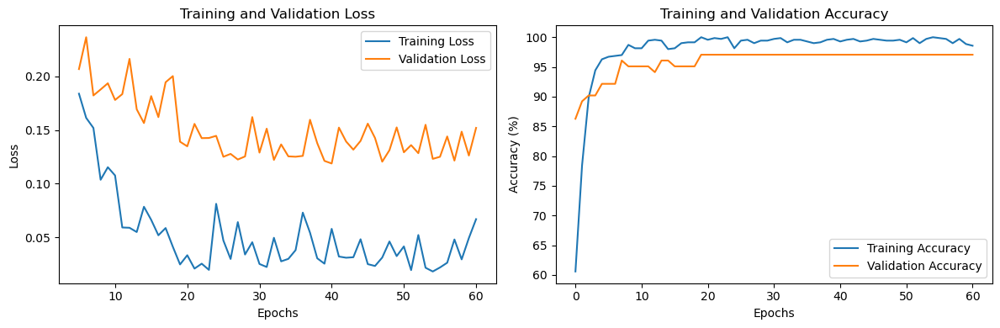

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  52 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8266414193944498, Training Accuracy: 52.57142857142857%, Avg. Validation Loss: 0.27115646430424284, Validation Accuracy: 94.11764705882354%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5409605828198519, Training Accuracy: 75.28571428571429%, Avg. Validation Loss: 0.1760115080646106, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3413283482871272, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.21758153928177698, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.30550105802037497, Training Accuracy: 94.85714285714286%, Avg. Validation Loss: 0.1852481641939708, Validation Accuracy: 90.19607843137256%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

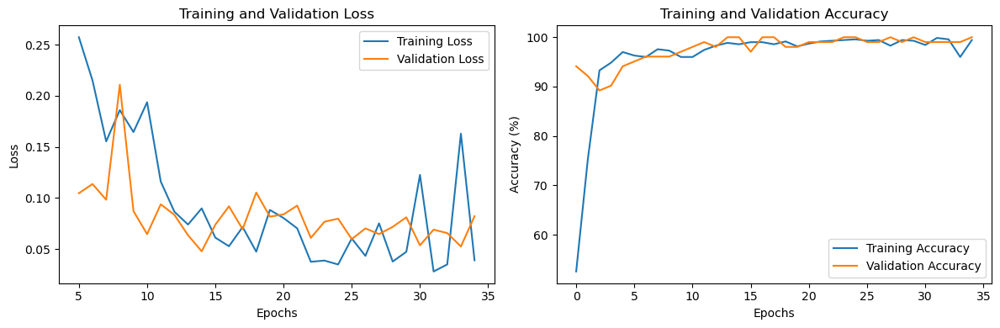

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8883878241262684
[[182   2]
 [  1  13]]
##################################### Iteration  53 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6166422651572661, Training Accuracy: 63.714285714285715%, Avg. Validation Loss: 0.48890878898756845, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.41996901617808774, Training Accuracy: 83.85714285714286%, Avg. Validation Loss: 0.2835118089403425, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.307717062194239, Training Accuracy: 91.28571428571429%, Avg. Validation Loss: 0.2744726240634918, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.20452306165613912, Training Accuracy: 96.28571428571429%, Avg. Validation Loss: 0.24052133517605917, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [42/10000], Avg. Training Loss: 0.07001398829743266, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.14076924696564674, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.038426216056739744, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.1337515993842057, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.06366580663333563, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.133454187640122, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.05454946353777566, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.13293199400816644, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.03934620039283552, Training Accuracy: 99.28571428571429%, Avg. V

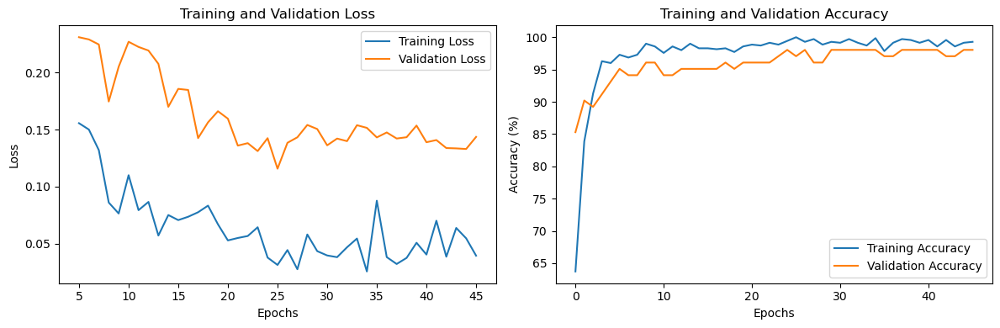

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.7115804806991988
[[179   5]
 [  3  11]]
##################################### Iteration  54 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5653427764773369, Training Accuracy: 71.42857142857143%, Avg. Validation Loss: 0.575820824929646, Validation Accuracy: 72.54901960784314%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.37997971576723183, Training Accuracy: 84.14285714285714%, Avg. Validation Loss: 0.27314445802143644, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.25570903125811706, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.24660561978816986, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.16751583039083265, Training Accuracy: 95.0%, Avg. Validation Loss: 0.23902105114289693, Validation Accuracy: 88.23529411764706%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.173492979

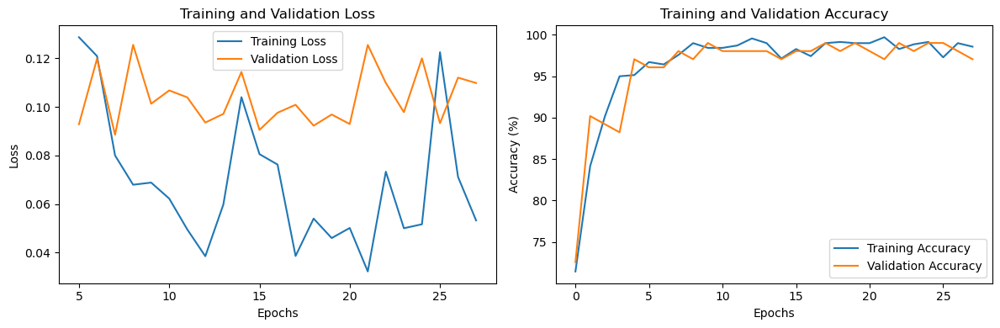

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.6708229426433916
[[181   3]
 [  5   9]]
##################################### Iteration  55 #####################################
Epoch [1/10000], Avg. Training Loss: 0.674893016164953, Training Accuracy: 62.142857142857146%, Avg. Validation Loss: 0.5779979612146106, Validation Accuracy: 79.41176470588235%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5338817110115831, Training Accuracy: 73.42857142857143%, Avg. Validation Loss: 0.3855673926217215, Validation Accuracy: 86.27450980392157%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.37138043106956914, Training Accuracy: 86.85714285714286%, Avg. Validation Loss: 0.3745053687265941, Validation Accuracy: 86.27450980392157%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24488979239355435, Training Accuracy: 93.14285714285714%, Avg. Validation Loss: 0.24718725787741797, Validation Accuracy: 90.19607843137256%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

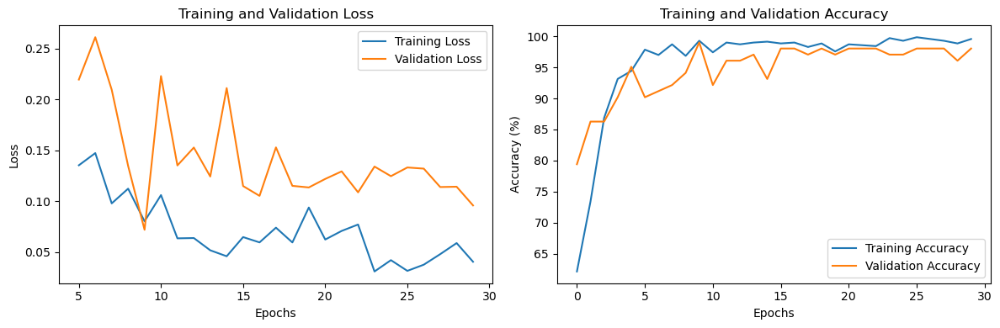

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8139797068771139
[[181   3]
 [  2  12]]
##################################### Iteration  56 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6558511880311099, Training Accuracy: 63.857142857142854%, Avg. Validation Loss: 0.3440586158207485, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.47549486228010873, Training Accuracy: 86.42857142857143%, Avg. Validation Loss: 0.20250774707112992, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.38483362983573566, Training Accuracy: 92.28571428571429%, Avg. Validation Loss: 0.21559817237513407, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.33003622395071114, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.22830752389771597, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Lo

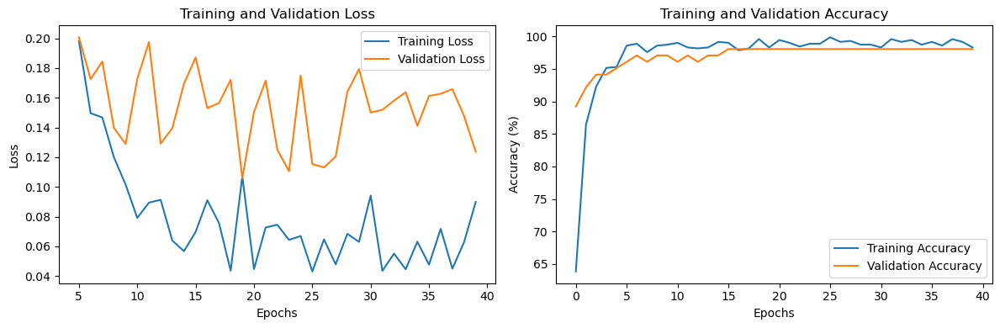

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8251501236312258
[[180   4]
 [  1  13]]
##################################### Iteration  57 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5675254050980915, Training Accuracy: 72.14285714285714%, Avg. Validation Loss: 0.48188500319208416, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.416592268103903, Training Accuracy: 86.28571428571429%, Avg. Validation Loss: 0.3018575438431331, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.31218479370529, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.2567733313356127, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23431245660917324, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.24337232964379446, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

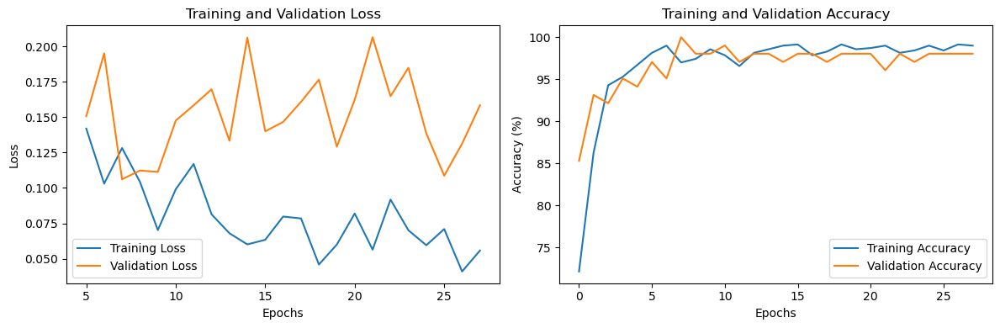

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7694099378881988
[[181   3]
 [  3  11]]
##################################### Iteration  58 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6447453925555403, Training Accuracy: 63.857142857142854%, Avg. Validation Loss: 0.4339656744684492, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4481893249533393, Training Accuracy: 78.14285714285714%, Avg. Validation Loss: 0.26833029304231915, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.32844053547490726, Training Accuracy: 89.0%, Avg. Validation Loss: 0.22094301453658513, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2507357055490667, Training Accuracy: 93.14285714285714%, Avg. Validation Loss: 0.1704153312104089, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.193339939

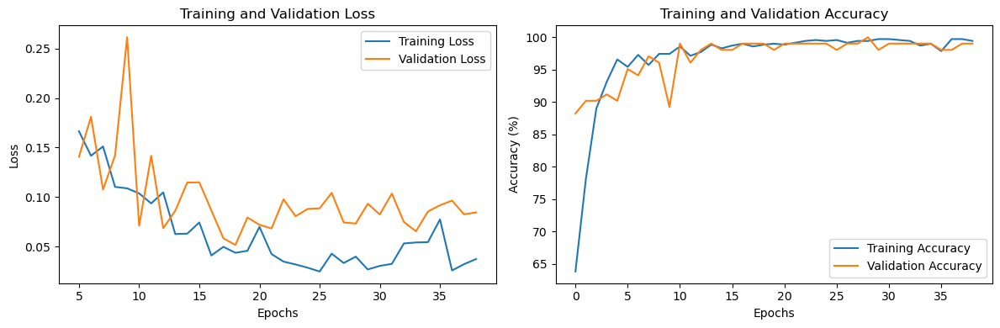

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8228980322003577
[[184   0]
 [  4  10]]
##################################### Iteration  59 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7181889496066354, Training Accuracy: 53.42857142857143%, Avg. Validation Loss: 0.31985494068690706, Validation Accuracy: 94.11764705882354%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5725216743620959, Training Accuracy: 69.57142857142857%, Avg. Validation Loss: 0.22729287615844182, Validation Accuracy: 96.07843137254902%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.43519465354355896, Training Accuracy: 86.28571428571429%, Avg. Validation Loss: 0.20363601403576986, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.36455652625723317, Training Accuracy: 93.42857142857143%, Avg. Validation Loss: 0.17490799299308232, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Lo

Epoch [41/10000], Avg. Training Loss: 0.04844625831835649, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.12255096063017845, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.0425100014121695, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.16093450199280465, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.05091853143477982, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.11073297528283936, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.03624090399931778, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.16277882935745375, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.0428049061447382, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.11269700899720192, Validation Accuracy: 97.0

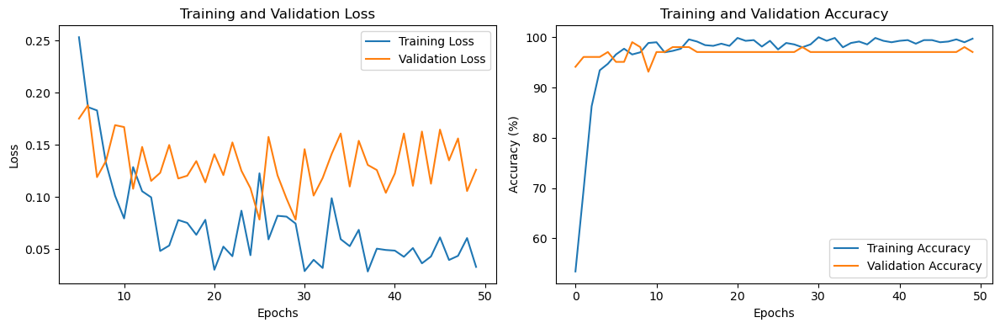

Accuracy of the network on the test set: 99.4949494949495 %, kappa: 0.9602569249297471
[[184   0]
 [  1  13]]
##################################### Iteration  60 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5173577666282654, Training Accuracy: 74.57142857142857%, Avg. Validation Loss: 0.4795650201184409, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3800628422336145, Training Accuracy: 88.42857142857143%, Avg. Validation Loss: 0.32845339604786467, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.28735509277744725, Training Accuracy: 94.57142857142857%, Avg. Validation Loss: 0.26701359876564573, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22111214697360992, Training Accuracy: 96.71428571428571%, Avg. Validation Loss: 0.22118718709264482, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [40/10000], Avg. Training Loss: 0.05480035286481408, Training Accuracy: 99.0%, Avg. Validation Loss: 0.13150192371436528, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.06459066726859998, Training Accuracy: 99.0%, Avg. Validation Loss: 0.13810855150222778, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.03008339945650236, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.1271068107868944, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.07044905390251767, Training Accuracy: 98.0%, Avg. Validation Loss: 0.13020975994212286, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.03322107620029287, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.14356375804969243, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004

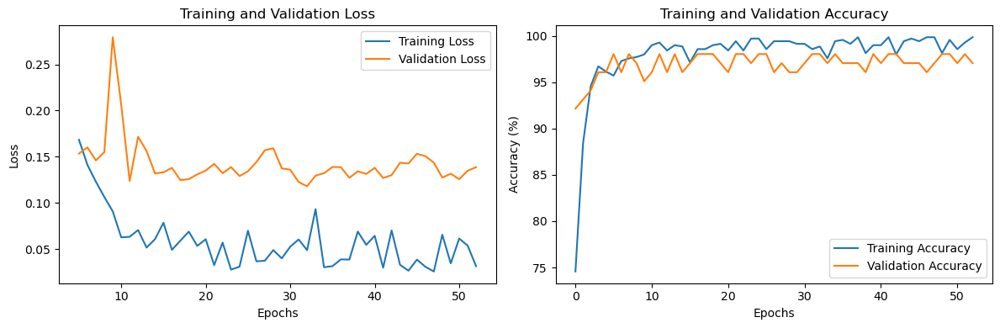

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.6925465838509317
[[180   4]
 [  4  10]]
##################################### Iteration  61 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7694561589847911, Training Accuracy: 52.42857142857143%, Avg. Validation Loss: 0.4935877663748605, Validation Accuracy: 77.45098039215686%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5830853391777385, Training Accuracy: 69.57142857142857%, Avg. Validation Loss: 0.270712924855096, Validation Accuracy: 89.2156862745098%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4176344180648977, Training Accuracy: 86.57142857142857%, Avg. Validation Loss: 0.2738704723971231, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3289488506588069, Training Accuracy: 93.57142857142857%, Avg. Validation Loss: 0.28400231684957233, Validation Accuracy: 90.19607843137256%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.28

Epoch [41/10000], Avg. Training Loss: 0.05130065933123908, Training Accuracy: 99.0%, Avg. Validation Loss: 0.08748168764369828, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.03565287786874582, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.10819178553564208, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.03406283223408867, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.11051652527281217, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.05222490436228162, Training Accuracy: 99.0%, Avg. Validation Loss: 0.09727945391620908, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.06373441409827633, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.1305677518248558, Validation Accuracy: 97.05882352941177%, lr: 1.000

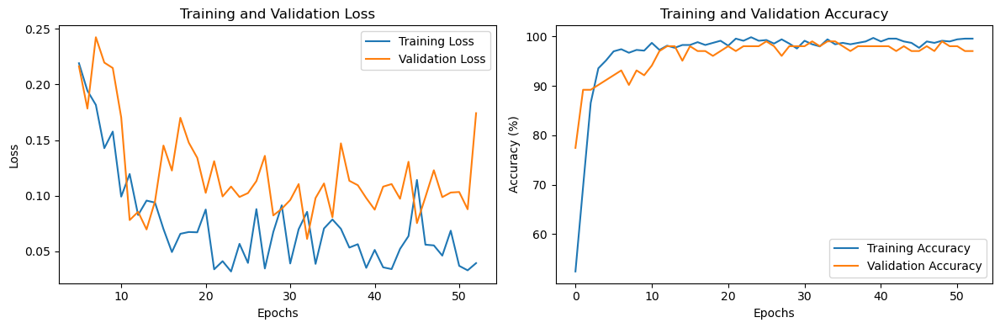

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.755210173083716
[[179   5]
 [  2  12]]
##################################### Iteration  62 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6529498926617883, Training Accuracy: 56.285714285714285%, Avg. Validation Loss: 0.5072572146143232, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.48252181844277814, Training Accuracy: 77.57142857142857%, Avg. Validation Loss: 0.3677710635321481, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.36882647397843277, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.28034607001713346, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.31183806535872544, Training Accuracy: 94.14285714285714%, Avg. Validation Loss: 0.21505414375237056, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

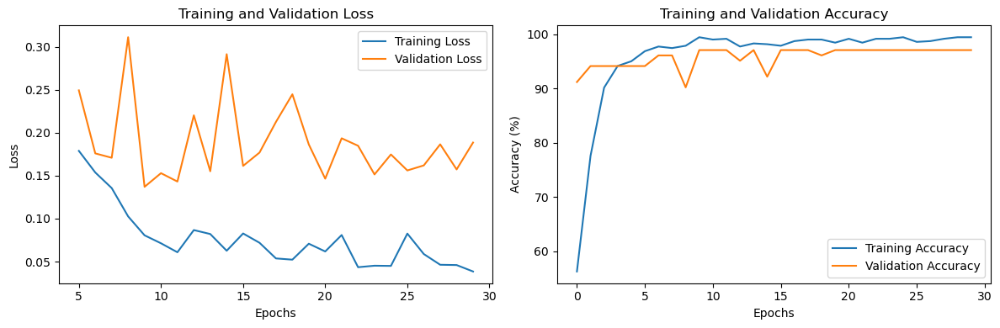

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.769076974341886
[[178   6]
 [  1  13]]
##################################### Iteration  63 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8567218279296701, Training Accuracy: 46.857142857142854%, Avg. Validation Loss: 0.34315383221421925, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5413908396254886, Training Accuracy: 72.71428571428571%, Avg. Validation Loss: 0.2770801782608032, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3614629747515375, Training Accuracy: 92.14285714285714%, Avg. Validation Loss: 0.21390893097434724, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.29861381819302385, Training Accuracy: 96.28571428571429%, Avg. Validation Loss: 0.145156734756061, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

Epoch [41/10000], Avg. Training Loss: 0.06651339726522565, Training Accuracy: 100.0%, Avg. Validation Loss: 0.126470503530332, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.07381515975364229, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.10489420326692718, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.08509189051321962, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.11577041127852031, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.09275347417728468, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.11133556600127902, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.08010414818471129, Training Accuracy: 99.0%, Avg. Validation Loss: 0.10656314689133849, Validation Accuracy: 98.03921568627452%, lr: 1.000

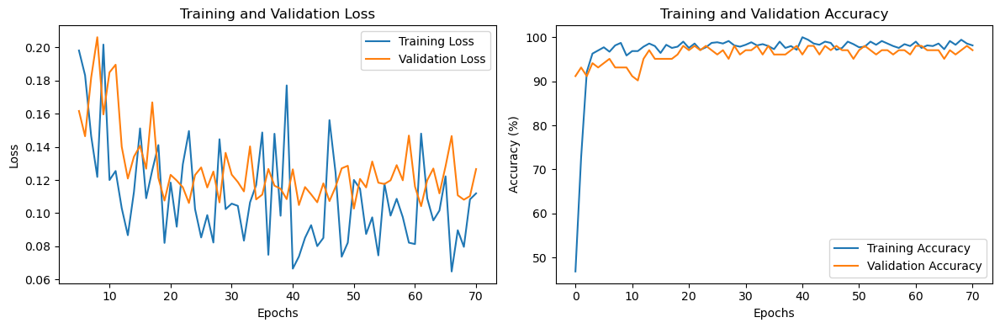

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.7190160832544938
[[176   8]
 [  1  13]]
##################################### Iteration  64 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8014811453494158, Training Accuracy: 48.42857142857143%, Avg. Validation Loss: 0.3941683939525059, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5763013383204286, Training Accuracy: 67.85714285714286%, Avg. Validation Loss: 0.2794713569538934, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4543169980699366, Training Accuracy: 86.42857142857143%, Avg. Validation Loss: 0.19570458680391312, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3662295700474219, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.2088559546640941, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

Epoch [41/10000], Avg. Training Loss: 0.04283949817446145, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.07980927079916, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.07990129787305539, Training Accuracy: 99.0%, Avg. Validation Loss: 0.08313047619802612, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.07164578088982539, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.07720678485929966, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.10747841432351958, Training Accuracy: 98.0%, Avg. Validation Loss: 0.0808015311402934, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.07974850538779389, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.0859013314225844, Validation Accuracy: 99.01960784313725%, lr: 1.0000000

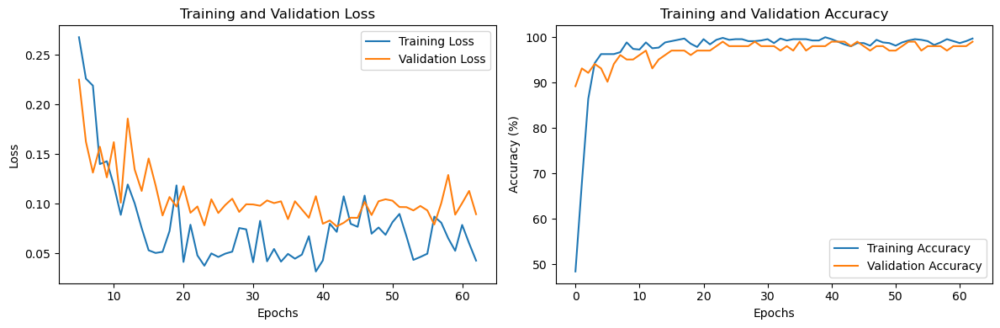

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8251501236312258
[[180   4]
 [  1  13]]
##################################### Iteration  65 #####################################
Epoch [1/10000], Avg. Training Loss: 1.0496202151883731, Training Accuracy: 39.57142857142857%, Avg. Validation Loss: 0.32854665177209036, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.7378292029554193, Training Accuracy: 53.285714285714285%, Avg. Validation Loss: 0.21896638401917048, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4995839453556321, Training Accuracy: 78.0%, Avg. Validation Loss: 0.19969878026417323, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.32703631168062036, Training Accuracy: 92.14285714285714%, Avg. Validation Loss: 0.15592574594276293, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.3134771

Epoch [41/10000], Avg. Training Loss: 0.04048773049461571, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.11314562867794718, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.04514895150945945, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.11549030590270247, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


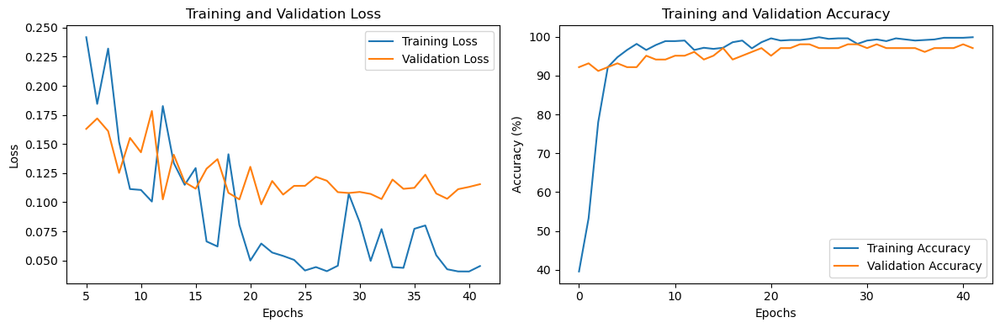

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8251501236312258
[[180   4]
 [  1  13]]
##################################### Iteration  66 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6829044588587501, Training Accuracy: 56.57142857142857%, Avg. Validation Loss: 0.43624424934387207, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5747316066514362, Training Accuracy: 74.57142857142857%, Avg. Validation Loss: 0.3165889722960336, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.47180480509996414, Training Accuracy: 87.85714285714286%, Avg. Validation Loss: 0.2328511348792485, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3892325162887573, Training Accuracy: 93.71428571428571%, Avg. Validation Loss: 0.22498943975993566, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

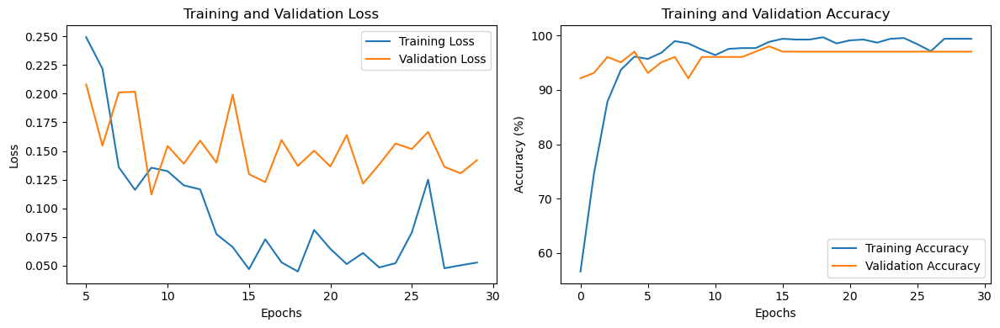

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8139797068771139
[[181   3]
 [  2  12]]
##################################### Iteration  67 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7215743227438494, Training Accuracy: 56.0%, Avg. Validation Loss: 0.37598933066640583, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.507310612635179, Training Accuracy: 80.0%, Avg. Validation Loss: 0.31189375051430296, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3958584117618474, Training Accuracy: 91.71428571428571%, Avg. Validation Loss: 0.20537787356546947, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3199224377220327, Training Accuracy: 96.42857142857143%, Avg. Validation Loss: 0.16993361498628343, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.25943288985978474, Trai

Epoch [41/10000], Avg. Training Loss: 0.12057898032732985, Training Accuracy: 97.85714285714286%, Avg. Validation Loss: 0.13228252742971694, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.06865585248240015, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.11630413521613393, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.1254708008332686, Training Accuracy: 97.14285714285714%, Avg. Validation Loss: 0.1452446063714368, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.11322947244413874, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.14170945648636138, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.06237830225886269, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.15137847300086701, Validation Accuracy: 95.0

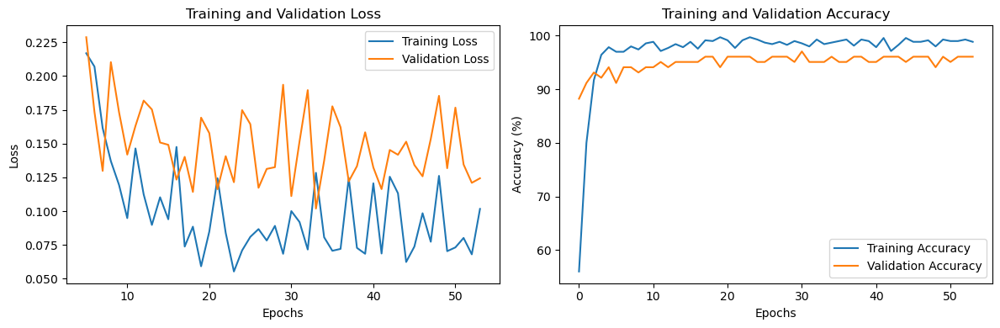

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.6651634723788049
[[179   5]
 [  4  10]]
##################################### Iteration  68 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8838016878474843, Training Accuracy: 36.0%, Avg. Validation Loss: 0.35682421922683716, Validation Accuracy: 94.11764705882354%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6735935963012956, Training Accuracy: 54.42857142857143%, Avg. Validation Loss: 0.1893280701977866, Validation Accuracy: 96.07843137254902%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.5013768706809391, Training Accuracy: 82.42857142857143%, Avg. Validation Loss: 0.17468215312276567, Validation Accuracy: 97.05882352941177%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.44974304329265247, Training Accuracy: 91.71428571428571%, Avg. Validation Loss: 0.14558670137609755, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.356885898

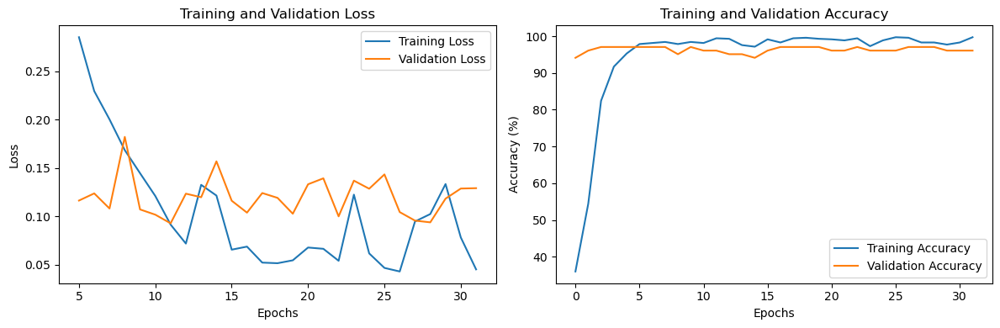

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8557902403495994
[[181   3]
 [  1  13]]
##################################### Iteration  69 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6122109043327245, Training Accuracy: 67.42857142857143%, Avg. Validation Loss: 0.5501612084252494, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4898645688186992, Training Accuracy: 81.42857142857143%, Avg. Validation Loss: 0.3851478695869446, Validation Accuracy: 97.05882352941177%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3661067414690148, Training Accuracy: 90.57142857142857%, Avg. Validation Loss: 0.2406086027622223, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.28839319334788754, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.20244039595127106, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

Epoch [41/10000], Avg. Training Loss: 0.05687011338093064, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.12244772485324315, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


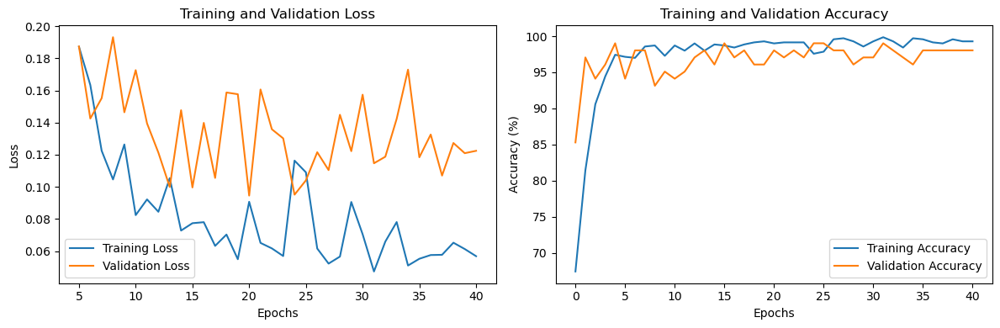

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7531172069825437
[[182   2]
 [  4  10]]
##################################### Iteration  70 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6294439245354045, Training Accuracy: 66.42857142857143%, Avg. Validation Loss: 0.49213941182409016, Validation Accuracy: 81.37254901960785%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.47947950999845157, Training Accuracy: 79.0%, Avg. Validation Loss: 0.2617599048784801, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.31497996198860084, Training Accuracy: 91.14285714285714%, Avg. Validation Loss: 0.16050602814980916, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22663866830143062, Training Accuracy: 95.57142857142857%, Avg. Validation Loss: 0.15488921850919724, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1728852

Epoch [40/10000], Avg. Training Loss: 0.0801708702929318, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.16631032739366805, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.08674686812711033, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.13656605354377202, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.0549166362139989, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.14783835198198045, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.06979729497635906, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.16348959505558014, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.10293108356100591, Training Accuracy: 97.71428571428571%, Avg. Validation Loss: 0.1472467343722071, Validation Accuracy: 97.05

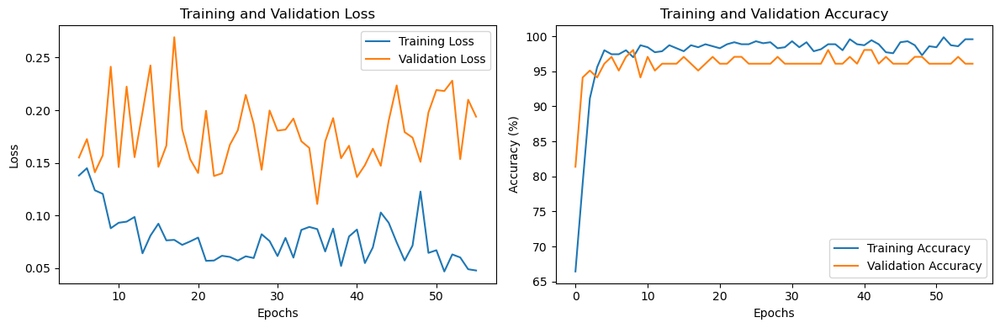

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8557902403495994
[[181   3]
 [  1  13]]
##################################### Iteration  71 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6332881470972841, Training Accuracy: 65.57142857142857%, Avg. Validation Loss: 0.46251778091703144, Validation Accuracy: 80.3921568627451%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.44954522292722354, Training Accuracy: 82.14285714285714%, Avg. Validation Loss: 0.3000333479472569, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.25963332199237565, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.2625517802579062, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22795222360979428, Training Accuracy: 94.14285714285714%, Avg. Validation Loss: 0.18996119179895946, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [41/10000], Avg. Training Loss: 0.03856005030684173, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.09977736643382482, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [42/10000], Avg. Training Loss: 0.04469797294586897, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.1443035677075386, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000002e-07
Epoch [43/10000], Avg. Training Loss: 0.0644993611865423, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.10423570019858223, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [44/10000], Avg. Training Loss: 0.047171656105836686, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.10903705124344144, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch 00040: reducing learning rate of group 0 to 1.0000e-08.
Epoch [45/10000], Avg. Training Loss: 0.05761953028426929, Training Accuracy: 99.14285714285714%, Avg. 

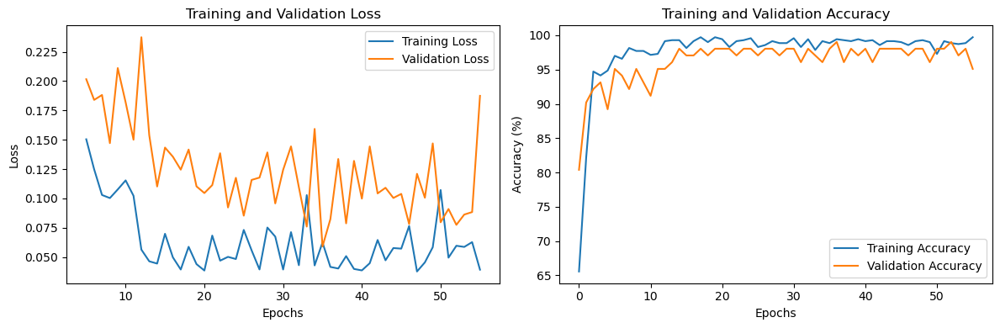

Accuracy of the network on the test set: 92.92929292929293 %, kappa: 0.5954465849387041
[[172  12]
 [  2  12]]
##################################### Iteration  72 #####################################
Epoch [1/10000], Avg. Training Loss: 1.1090497198429974, Training Accuracy: 34.42857142857143%, Avg. Validation Loss: 0.21245789102145604, Validation Accuracy: 95.09803921568627%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.8406740237366069, Training Accuracy: 48.285714285714285%, Avg. Validation Loss: 0.14905575343540736, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.5802174420519308, Training Accuracy: 68.14285714285714%, Avg. Validation Loss: 0.1244675921542304, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.4496306147087704, Training Accuracy: 87.14285714285714%, Avg. Validation Loss: 0.13731809705495834, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [43/10000], Avg. Training Loss: 0.04689364524727518, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.05872624846441405, Validation Accuracy: 100.0%, lr: 1.0000000000000002e-07
Epoch [44/10000], Avg. Training Loss: 0.05270257647233931, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.09875501426202911, Validation Accuracy: 100.0%, lr: 1.0000000000000002e-07
Early stopping due to no improvement in validation loss.


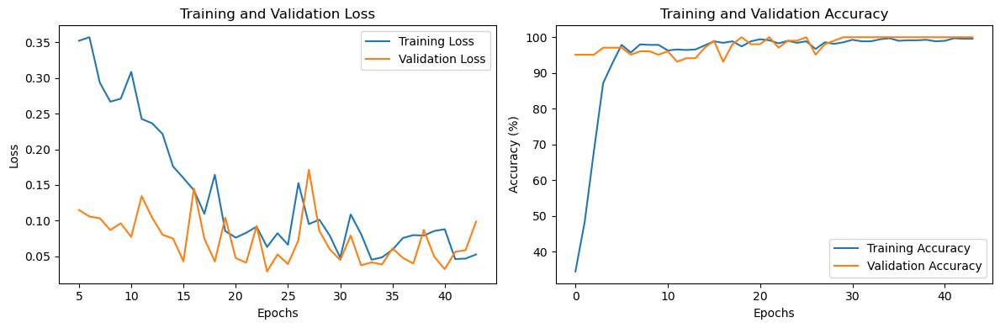

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8557902403495994
[[181   3]
 [  1  13]]
##################################### Iteration  73 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5711488987911831, Training Accuracy: 69.85714285714286%, Avg. Validation Loss: 0.40344485214778353, Validation Accuracy: 90.19607843137256%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.36856802146543155, Training Accuracy: 86.57142857142857%, Avg. Validation Loss: 0.30718489842755453, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.29957665740088985, Training Accuracy: 90.85714285714286%, Avg. Validation Loss: 0.23871200531721115, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.21124864200299437, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.17190739938191005, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training L

Epoch [41/10000], Avg. Training Loss: 0.026351839886046946, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.14192819595336914, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [42/10000], Avg. Training Loss: 0.06254484361587939, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.11999974133712905, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.022992574884979564, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.1118006839283875, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.034524775480597535, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.11163484358361789, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.02779382145540281, Training Accuracy: 99.57142857142857%, Av

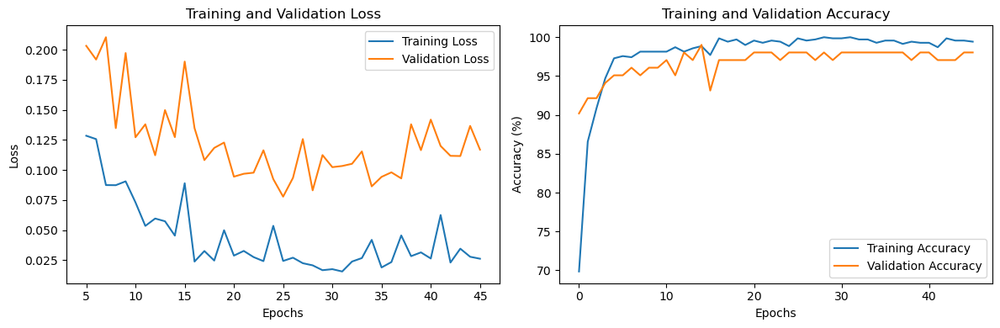

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9278951201747997
[[182   2]
 [  0  14]]
##################################### Iteration  74 #####################################
Epoch [1/10000], Avg. Training Loss: 0.9248137853362344, Training Accuracy: 47.285714285714285%, Avg. Validation Loss: 0.2958162490810667, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6429894532669674, Training Accuracy: 66.57142857142857%, Avg. Validation Loss: 0.2070304293717657, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4091376851905476, Training Accuracy: 89.14285714285714%, Avg. Validation Loss: 0.17068580218723842, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3174477575177496, Training Accuracy: 94.57142857142857%, Avg. Validation Loss: 0.12435575255325862, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [40/10000], Avg. Training Loss: 0.09755975507538427, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.08003238588571548, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.09110752179880034, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.08121587016752788, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.11366492924703793, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.10376565051930291, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.16687996575439518, Training Accuracy: 97.57142857142857%, Avg. Validation Loss: 0.06931032027517046, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.1828741537068378, Training Accuracy: 97.42857142857143%, Avg. Validation Loss: 0.06428021006286144, Validation Accuracy: 97.

Epoch [80/10000], Avg. Training Loss: 0.10054421568797393, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.08086255245975085, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [81/10000], Avg. Training Loss: 0.12191964745182883, Training Accuracy: 97.71428571428571%, Avg. Validation Loss: 0.09324243717959949, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [82/10000], Avg. Training Loss: 0.12627962240102616, Training Accuracy: 98.14285714285714%, Avg. Validation Loss: 0.12593316499676024, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [83/10000], Avg. Training Loss: 0.101639192128046, Training Accuracy: 99.0%, Avg. Validation Loss: 0.07971236429044179, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [84/10000], Avg. Training Loss: 0.14299728204919535, Training Accuracy: 98.14285714285714%, Avg. Validation Loss: 0.06226086909217494, Validation Accuracy: 97.05882352941177

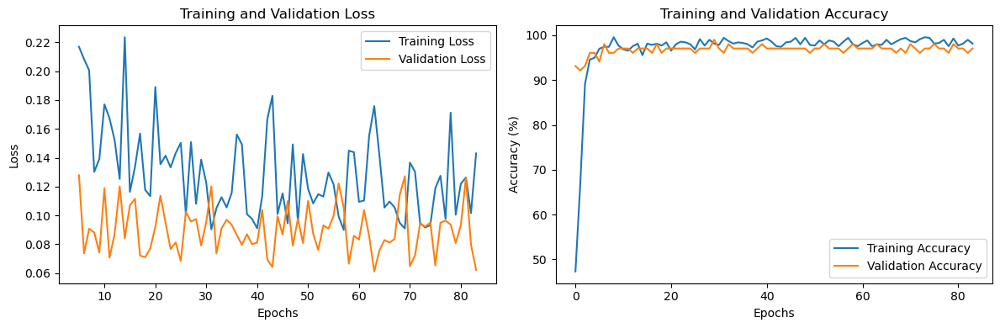

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7962962962962963
[[179   5]
 [  1  13]]
##################################### Iteration  75 #####################################
Epoch [1/10000], Avg. Training Loss: 0.612899662418799, Training Accuracy: 67.14285714285714%, Avg. Validation Loss: 0.451739673103605, Validation Accuracy: 87.25490196078431%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4634556763551452, Training Accuracy: 81.85714285714286%, Avg. Validation Loss: 0.3458442858287266, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.36042241142554715, Training Accuracy: 90.42857142857143%, Avg. Validation Loss: 0.27058411070278715, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.28029578212987294, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.20834421047142573, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

Epoch [41/10000], Avg. Training Loss: 0.0762718504040756, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.1348386002438409, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.04030678493224762, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.17720238651548112, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.03406020749190992, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.13966451372419084, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.06965497462078929, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.15222343589578355, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.03480343097312884, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.1546772899372237, Validation Accuracy: 98.03

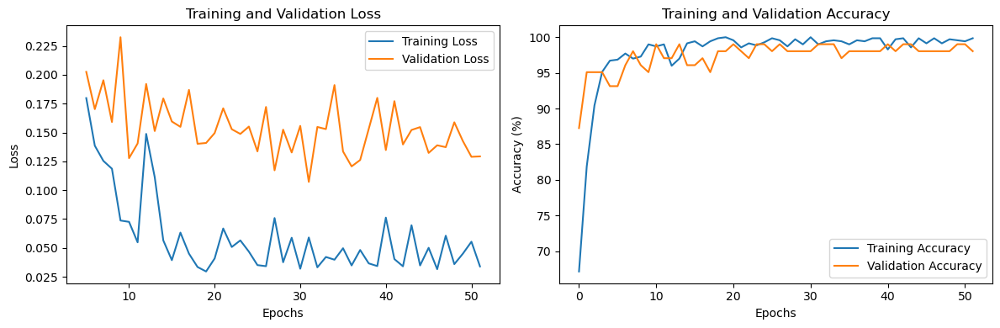

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  76 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6669506301934068, Training Accuracy: 62.57142857142857%, Avg. Validation Loss: 0.4345407656260899, Validation Accuracy: 84.31372549019608%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4956554262475534, Training Accuracy: 79.14285714285714%, Avg. Validation Loss: 0.3135870099067688, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.36532124098051677, Training Accuracy: 90.71428571428571%, Avg. Validation Loss: 0.1907372921705246, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3005389019169591, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.28810770383902956, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

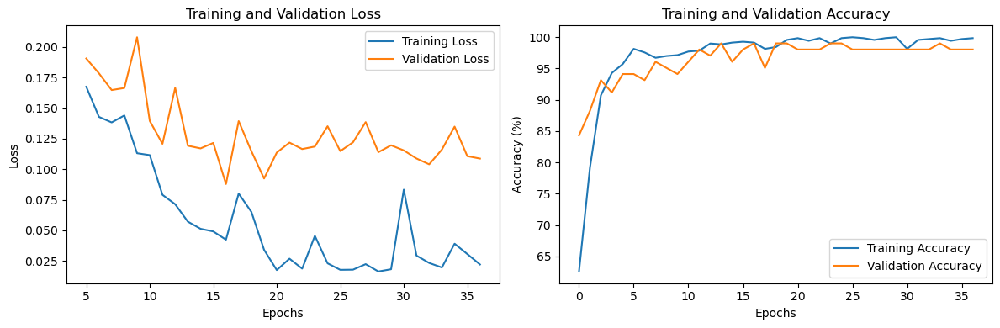

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  77 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6476717002012513, Training Accuracy: 61.285714285714285%, Avg. Validation Loss: 0.44671683652060373, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.45574742487885733, Training Accuracy: 80.42857142857143%, Avg. Validation Loss: 0.27099197464329855, Validation Accuracy: 96.07843137254902%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3102227215739814, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.2541764740433012, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24615260620008816, Training Accuracy: 96.14285714285714%, Avg. Validation Loss: 0.2291494416339057, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

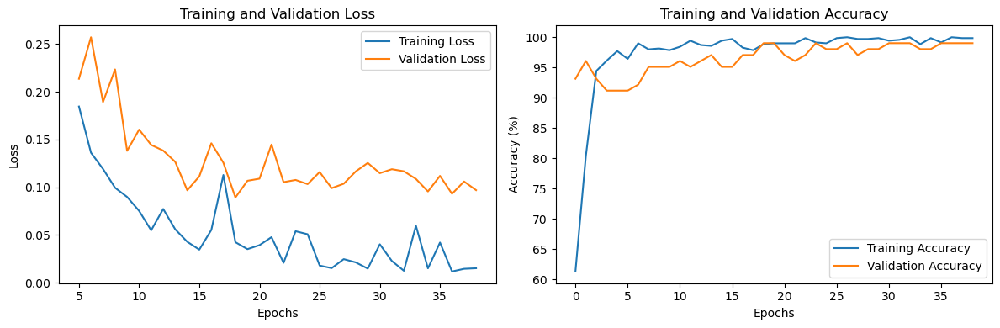

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9278951201747997
[[182   2]
 [  0  14]]
##################################### Iteration  78 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5912549421191216, Training Accuracy: 68.85714285714286%, Avg. Validation Loss: 0.5268276504107884, Validation Accuracy: 81.37254901960785%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3634175377135927, Training Accuracy: 87.0%, Avg. Validation Loss: 0.2547765501907894, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.25384522703560913, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.2593115781034742, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.20379312014715237, Training Accuracy: 96.28571428571429%, Avg. Validation Loss: 0.23858527413436345, Validation Accuracy: 89.2156862745098%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.16677241298

Epoch [41/10000], Avg. Training Loss: 0.03583115265196697, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.10593865119985171, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


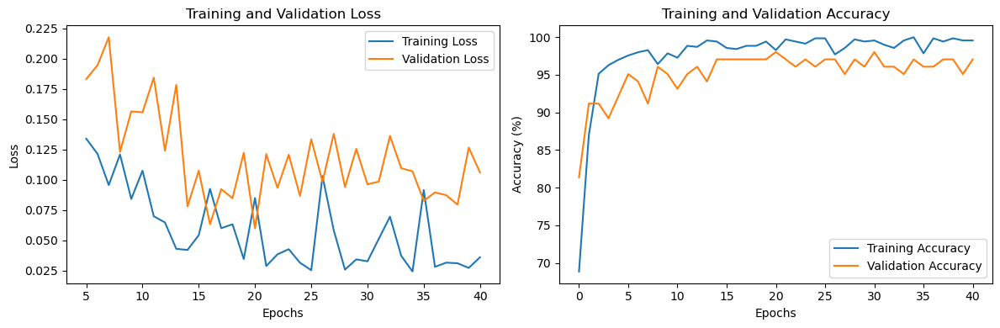

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  79 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7600398740985177, Training Accuracy: 50.714285714285715%, Avg. Validation Loss: 0.39028065119470867, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5895380763845011, Training Accuracy: 69.14285714285714%, Avg. Validation Loss: 0.25916731357574463, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4405068883841688, Training Accuracy: 89.14285714285714%, Avg. Validation Loss: 0.2898970714637211, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.38680516522039066, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.24020228109189443, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

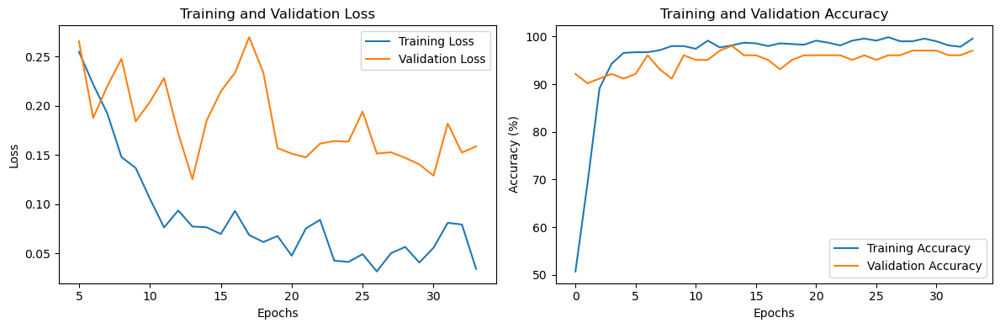

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8883878241262684
[[182   2]
 [  1  13]]
##################################### Iteration  80 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5829397365450859, Training Accuracy: 70.14285714285714%, Avg. Validation Loss: 0.5795415810176304, Validation Accuracy: 68.62745098039215%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.401972543109547, Training Accuracy: 88.42857142857143%, Avg. Validation Loss: 0.4312546636377062, Validation Accuracy: 86.27450980392157%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.29523323340849444, Training Accuracy: 93.71428571428571%, Avg. Validation Loss: 0.3434694494519915, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2599810483780774, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.1909812135355813, Validation Accuracy: 99.01960784313725%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2

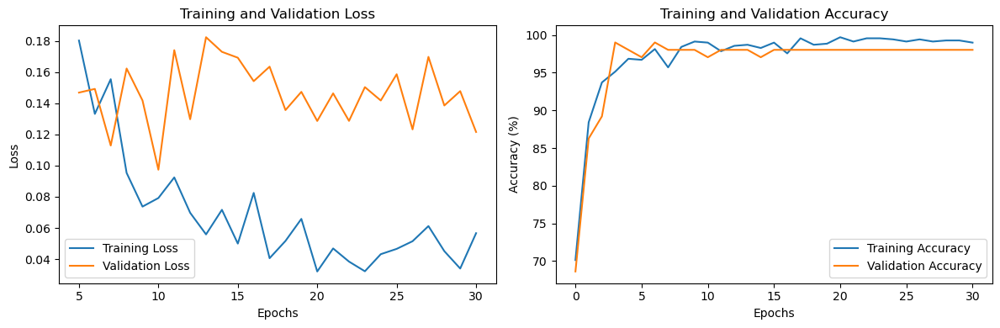

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.6925465838509317
[[180   4]
 [  4  10]]
##################################### Iteration  81 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8581621619788083, Training Accuracy: 43.714285714285715%, Avg. Validation Loss: 0.33781674930027555, Validation Accuracy: 96.07843137254902%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6554251706058328, Training Accuracy: 69.28571428571429%, Avg. Validation Loss: 0.1439939205135618, Validation Accuracy: 96.07843137254902%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4422023899175904, Training Accuracy: 88.42857142857143%, Avg. Validation Loss: 0.10818116845829147, Validation Accuracy: 98.03921568627452%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3709670244292779, Training Accuracy: 93.57142857142857%, Avg. Validation Loss: 0.13014426295246398, Validation Accuracy: 99.01960784313725%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [41/10000], Avg. Training Loss: 0.06635464596646753, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.08323662036231586, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.06908887036314065, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.08603604111288275, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.06448200632902709, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.07099792095167297, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.10946285868571563, Training Accuracy: 99.0%, Avg. Validation Loss: 0.07463014924100467, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.07393454015254974, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.054639529436826706, Validation Accuracy: 100.0%, lr: 1.

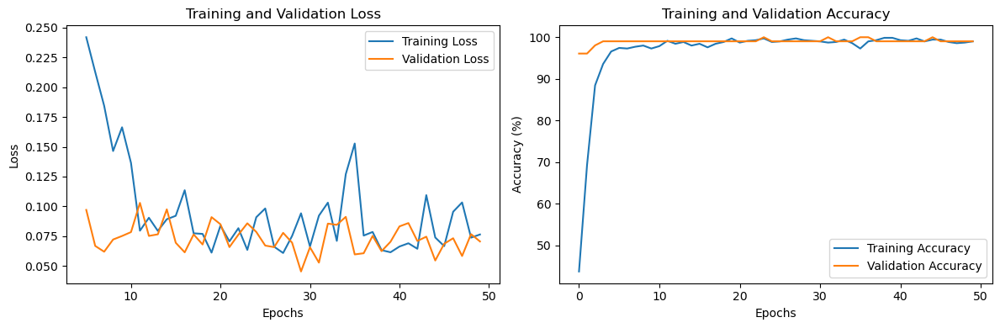

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7531172069825437
[[182   2]
 [  4  10]]
##################################### Iteration  82 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5875773097981106, Training Accuracy: 69.42857142857143%, Avg. Validation Loss: 0.5995729097298214, Validation Accuracy: 62.745098039215684%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.41104499386115506, Training Accuracy: 84.71428571428571%, Avg. Validation Loss: 0.35126061524663654, Validation Accuracy: 89.2156862745098%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2734977332028476, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.24802438489028386, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22887031835588542, Training Accuracy: 94.85714285714286%, Avg. Validation Loss: 0.25630409376961844, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

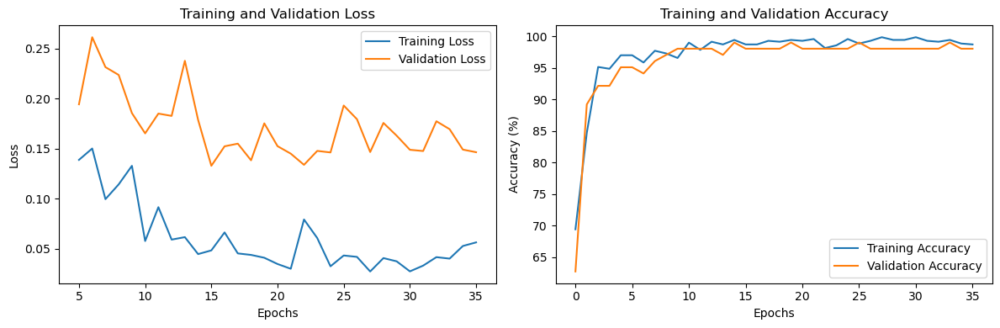

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8354114713216958
[[183   1]
 [  3  11]]
##################################### Iteration  83 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7008462250232697, Training Accuracy: 57.57142857142857%, Avg. Validation Loss: 0.4155867780957903, Validation Accuracy: 83.33333333333333%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.49525847285985947, Training Accuracy: 80.28571428571429%, Avg. Validation Loss: 0.2956926343696458, Validation Accuracy: 86.27450980392157%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.33335942910476163, Training Accuracy: 92.71428571428571%, Avg. Validation Loss: 0.23832487634250096, Validation Accuracy: 87.25490196078431%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2733424942601811, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.1900558407817568, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [41/10000], Avg. Training Loss: 0.036232765594666656, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.1424831332904952, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.03901330741461028, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.16797387174197606, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


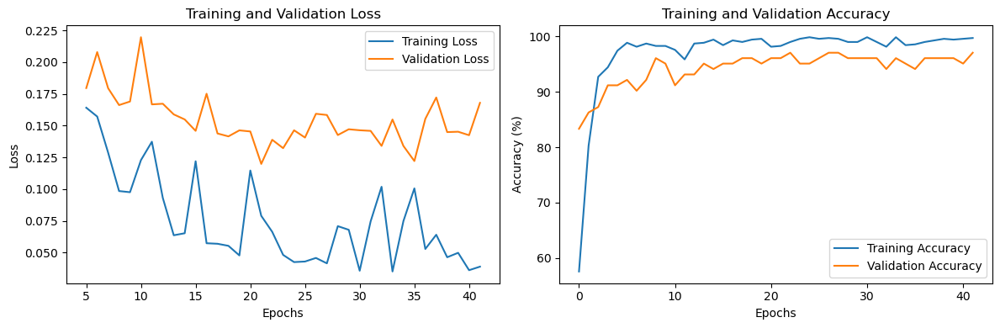

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.7283950617283951
[[178   6]
 [  2  12]]
##################################### Iteration  84 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5883135186000303, Training Accuracy: 67.71428571428571%, Avg. Validation Loss: 0.45103584442819866, Validation Accuracy: 81.37254901960785%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4202120839194818, Training Accuracy: 85.57142857142857%, Avg. Validation Loss: 0.33332681017262594, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.29305315153165296, Training Accuracy: 92.14285714285714%, Avg. Validation Loss: 0.2168153396674565, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22142277962782167, Training Accuracy: 93.71428571428571%, Avg. Validation Loss: 0.17536464227097376, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

Epoch [41/10000], Avg. Training Loss: 0.04724404338577932, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.08613544143736362, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.08425894303416664, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.07489687390625477, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.0387450047895651, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.11180147741522108, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.029484149343757468, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.10344361939600535, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.046973655550655996, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.12898947351745196, Validation Accuracy: 9

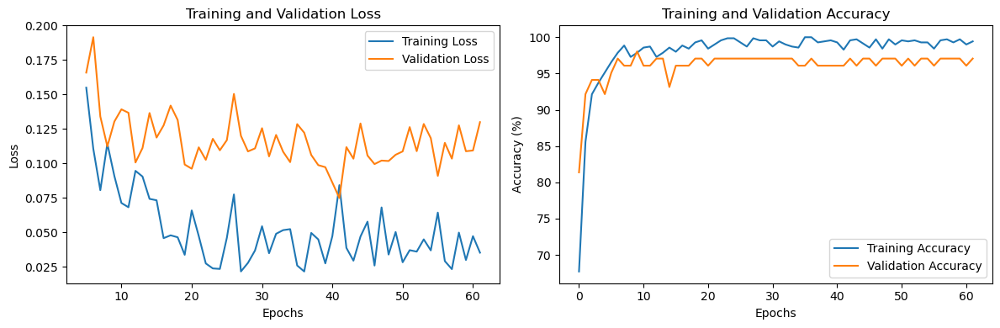

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.6161137440758293
[[181   3]
 [  6   8]]
##################################### Iteration  85 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5484378520737995, Training Accuracy: 73.14285714285714%, Avg. Validation Loss: 0.5588477807385581, Validation Accuracy: 84.31372549019608%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.456684292040088, Training Accuracy: 80.85714285714286%, Avg. Validation Loss: 0.4510981057371412, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.34952142428268085, Training Accuracy: 92.28571428571429%, Avg. Validation Loss: 0.3721644537789481, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2735386172478849, Training Accuracy: 95.71428571428571%, Avg. Validation Loss: 0.3105712022100176, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

Epoch [42/10000], Avg. Training Loss: 0.02646947093307972, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.10680481897933143, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.04870542045682669, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.10288358373301369, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.02426671899262477, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.10937242209911346, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.026405284435234287, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.11892921477556229, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.020821494918147273, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.1306057082755225, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Ep

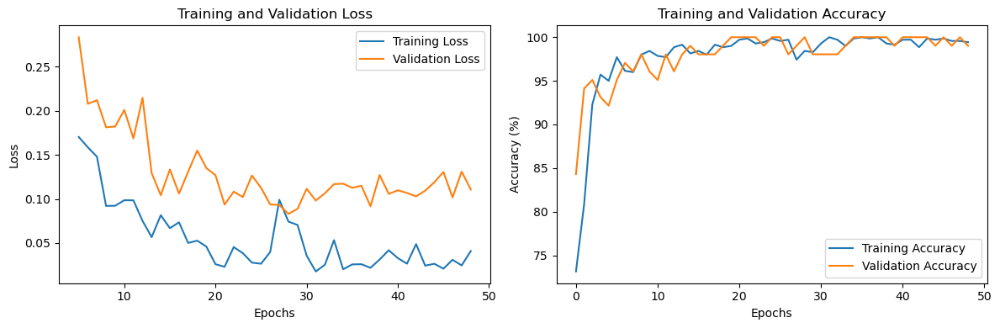

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8251501236312258
[[180   4]
 [  1  13]]
##################################### Iteration  86 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7522207688201558, Training Accuracy: 53.142857142857146%, Avg. Validation Loss: 0.4187600868088858, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5925992747599428, Training Accuracy: 68.85714285714286%, Avg. Validation Loss: 0.20715833348887308, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.42094574733213946, Training Accuracy: 86.85714285714286%, Avg. Validation Loss: 0.16706121606486185, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3220419402826916, Training Accuracy: 94.14285714285714%, Avg. Validation Loss: 0.1528003066778183, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

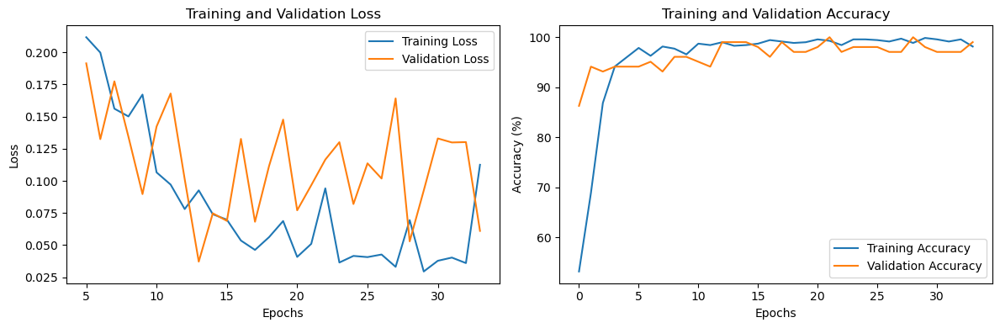

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.6778242677824268
[[183   1]
 [  6   8]]
##################################### Iteration  87 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6309404982761904, Training Accuracy: 63.57142857142857%, Avg. Validation Loss: 0.4061075576714107, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5007266822186384, Training Accuracy: 80.71428571428571%, Avg. Validation Loss: 0.28118426884923664, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4244107563387264, Training Accuracy: 89.85714285714286%, Avg. Validation Loss: 0.2582224522318159, Validation Accuracy: 97.05882352941177%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3354966626925902, Training Accuracy: 96.0%, Avg. Validation Loss: 0.24916668662003108, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.268047513609

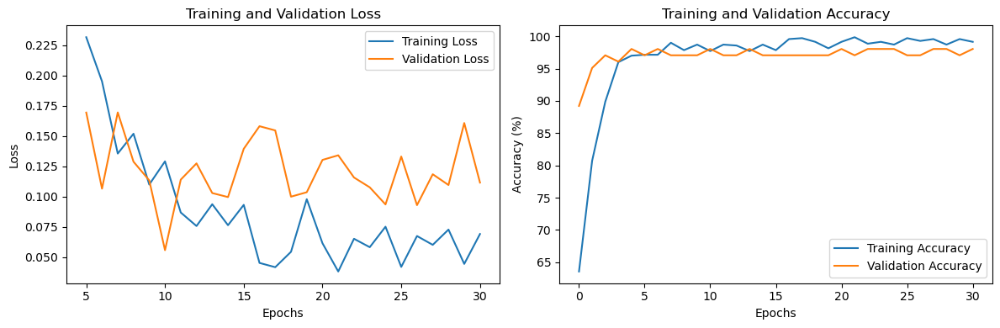

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.7115804806991988
[[179   5]
 [  3  11]]
##################################### Iteration  88 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8175293972546404, Training Accuracy: 52.285714285714285%, Avg. Validation Loss: 0.3293862300259726, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5319284769621763, Training Accuracy: 74.71428571428571%, Avg. Validation Loss: 0.1551771972860609, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3694254952398213, Training Accuracy: 87.0%, Avg. Validation Loss: 0.15032667773110525, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.21757883917201648, Training Accuracy: 96.57142857142857%, Avg. Validation Loss: 0.16297288558312825, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.216044661

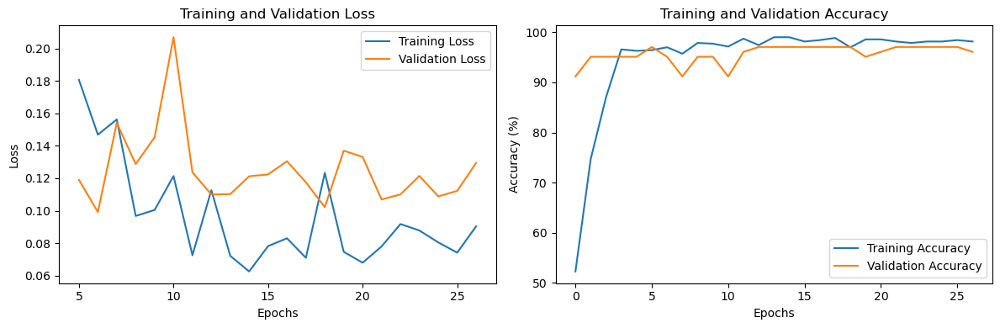

Accuracy of the network on the test set: 93.93939393939394 %, kappa: 0.6351351351351351
[[174  10]
 [  2  12]]
##################################### Iteration  89 #####################################
Epoch [1/10000], Avg. Training Loss: 0.537844789299098, Training Accuracy: 75.71428571428571%, Avg. Validation Loss: 0.6495437366621835, Validation Accuracy: 69.6078431372549%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3900792415846478, Training Accuracy: 88.14285714285714%, Avg. Validation Loss: 0.45536220499447416, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2992736145176671, Training Accuracy: 93.14285714285714%, Avg. Validation Loss: 0.4008805113179343, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24813650683923202, Training Accuracy: 95.0%, Avg. Validation Loss: 0.30059353581496645, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.199351682581

Epoch [41/10000], Avg. Training Loss: 0.04293005088005553, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.13580997980066709, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.0442017152143473, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.10969823758516993, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.06648023350333626, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.13364681282213756, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.04331270165064118, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.15737657994031906, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.06267581465230747, Training Accuracy: 99.0%, Avg. Validation Loss: 0.16695141898734228, Validation Accuracy: 98.0392156862745

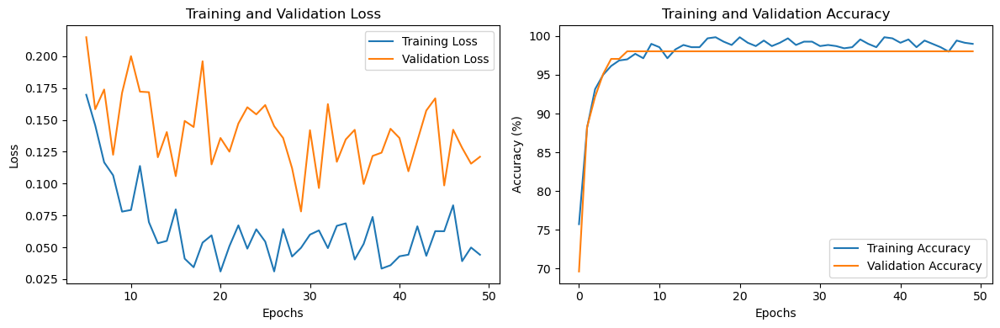

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8641975308641976
[[180   4]
 [  0  14]]
##################################### Iteration  90 #####################################
Epoch [1/10000], Avg. Training Loss: 0.560774683275006, Training Accuracy: 71.42857142857143%, Avg. Validation Loss: 0.5221655666828156, Validation Accuracy: 71.56862745098039%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4107119860974225, Training Accuracy: 89.71428571428571%, Avg. Validation Loss: 0.3598132963691439, Validation Accuracy: 85.29411764705883%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.31544968858361244, Training Accuracy: 93.42857142857143%, Avg. Validation Loss: 0.2949802151748112, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2529020177369768, Training Accuracy: 94.0%, Avg. Validation Loss: 0.29974646866321564, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.210069206119

Epoch [41/10000], Avg. Training Loss: 0.04264123322950168, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.13210251980594226, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.0547459042546424, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.11156248301267624, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.046358588045801626, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.08722893042223794, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.02447038224305619, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.1050299017557076, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.07866865292784166, Training Accuracy: 99.0%, Avg. Validation Loss: 0.08330170437693596, Validation Accuracy: 98.0392156862745

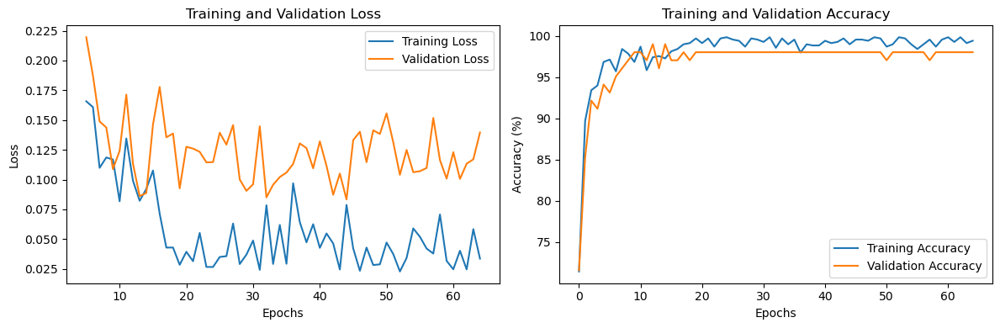

Accuracy of the network on the test set: 99.4949494949495 %, kappa: 0.9602569249297471
[[184   0]
 [  1  13]]
##################################### Iteration  91 #####################################
Epoch [1/10000], Avg. Training Loss: 0.722872025587342, Training Accuracy: 57.42857142857143%, Avg. Validation Loss: 0.4990735522338322, Validation Accuracy: 80.3921568627451%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5282385118983008, Training Accuracy: 74.14285714285714%, Avg. Validation Loss: 0.272403427532741, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3321232981979847, Training Accuracy: 91.28571428571429%, Avg. Validation Loss: 0.15499546698161534, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2824491692537611, Training Accuracy: 93.14285714285714%, Avg. Validation Loss: 0.17216417832033976, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.19

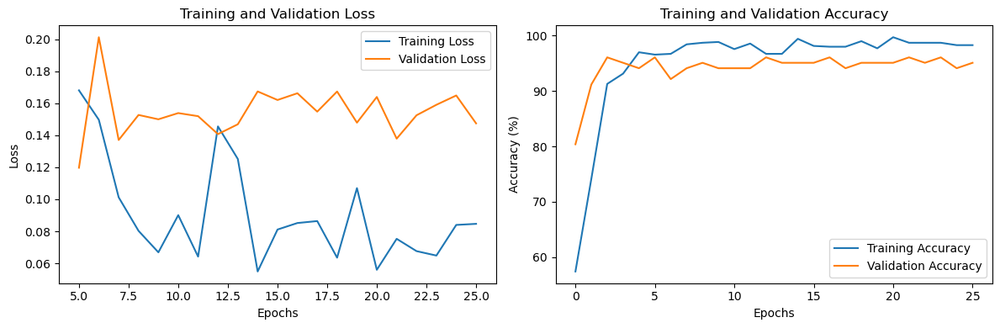

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.7115804806991988
[[179   5]
 [  3  11]]
##################################### Iteration  92 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8330421637405049, Training Accuracy: 43.57142857142857%, Avg. Validation Loss: 0.32379697050367084, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6556740382855589, Training Accuracy: 58.714285714285715%, Avg. Validation Loss: 0.17776071705988475, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4298893010074442, Training Accuracy: 88.0%, Avg. Validation Loss: 0.11349654703267983, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.33883967487649486, Training Accuracy: 93.85714285714286%, Avg. Validation Loss: 0.1579434084040778, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.29811881

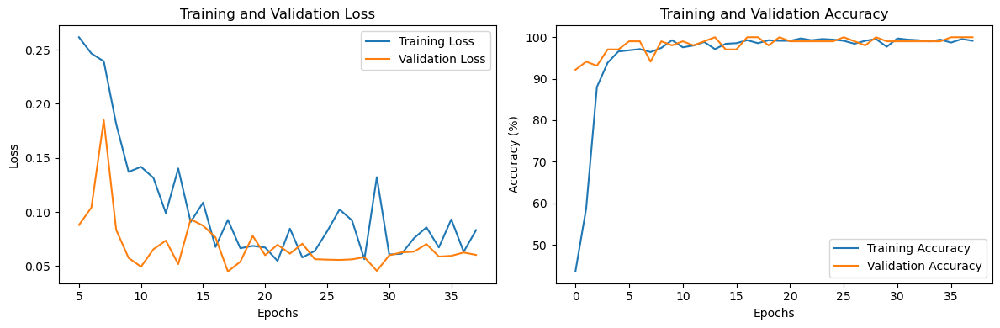

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7836853605243992
[[180   4]
 [  2  12]]
##################################### Iteration  93 #####################################
Epoch [1/10000], Avg. Training Loss: 0.48871772397648205, Training Accuracy: 78.42857142857143%, Avg. Validation Loss: 0.5912229716777802, Validation Accuracy: 70.58823529411765%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3571365004913373, Training Accuracy: 89.14285714285714%, Avg. Validation Loss: 0.4231813720294407, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.28256032412702387, Training Accuracy: 93.42857142857143%, Avg. Validation Loss: 0.36166607056345257, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22766615010120653, Training Accuracy: 95.42857142857143%, Avg. Validation Loss: 0.27570763656071257, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

Epoch [40/10000], Avg. Training Loss: 0.08729458375918595, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.22485335809843882, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


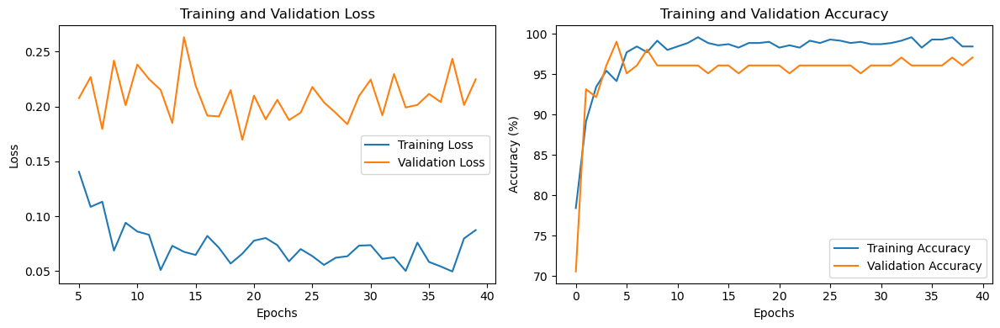

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9278951201747997
[[182   2]
 [  0  14]]
##################################### Iteration  94 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8241751756180417, Training Accuracy: 51.0%, Avg. Validation Loss: 0.22474695529256547, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5913548882712018, Training Accuracy: 67.85714285714286%, Avg. Validation Loss: 0.15862481083188737, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.41072680496356706, Training Accuracy: 88.42857142857143%, Avg. Validation Loss: 0.14986096641847066, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.34991258958523924, Training Accuracy: 93.57142857142857%, Avg. Validation Loss: 0.12771768761532648, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.3227063

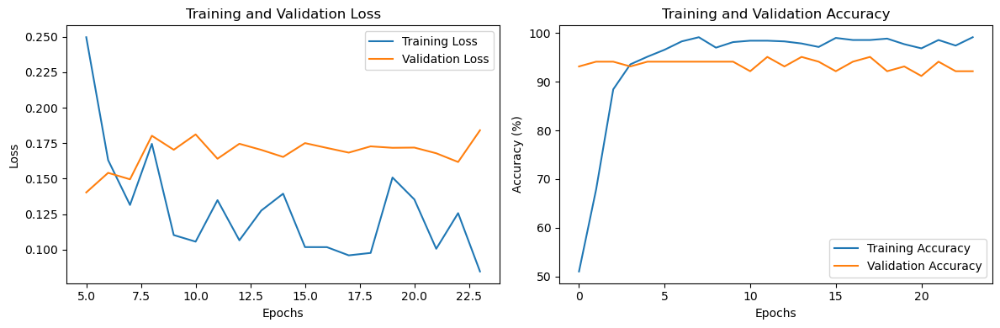

Accuracy of the network on the test set: 94.44444444444444 %, kappa: 0.6898319567074908
[[173  11]
 [  0  14]]
##################################### Iteration  95 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6219513714313507, Training Accuracy: 66.0%, Avg. Validation Loss: 0.46140456199645996, Validation Accuracy: 87.25490196078431%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4649622816253792, Training Accuracy: 81.0%, Avg. Validation Loss: 0.2628335633448192, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3090445890345357, Training Accuracy: 93.0%, Avg. Validation Loss: 0.21687911876610347, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24531785229390318, Training Accuracy: 95.42857142857143%, Avg. Validation Loss: 0.20072668577943528, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.19121855971488086, Training Accurac

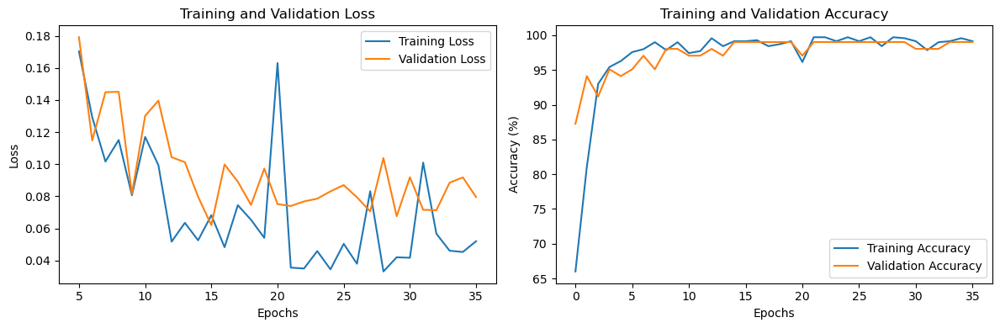

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9231366459627329
[[183   1]
 [  1  13]]
##################################### Iteration  96 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5671584761955522, Training Accuracy: 74.0%, Avg. Validation Loss: 0.5074695263590131, Validation Accuracy: 83.33333333333333%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4133218391375108, Training Accuracy: 86.0%, Avg. Validation Loss: 0.29060747793742586, Validation Accuracy: 97.05882352941177%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.31281767988746817, Training Accuracy: 91.28571428571429%, Avg. Validation Loss: 0.2516646661928722, Validation Accuracy: 97.05882352941177%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.21775136617096988, Training Accuracy: 97.14285714285714%, Avg. Validation Loss: 0.20004174751894815, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.16739846935326402, Tra

Epoch [41/10000], Avg. Training Loss: 0.05527600392021916, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.15863712557724544, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.045361659743569115, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.13753041412149156, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.04666583510962399, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.15193398935454233, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.03564414559778842, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.14045056062085287, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.08940095429054716, Training Accuracy: 98.0%, Avg. Validation Loss: 0.13374136654394014, Validation Accuracy: 97.05882352941

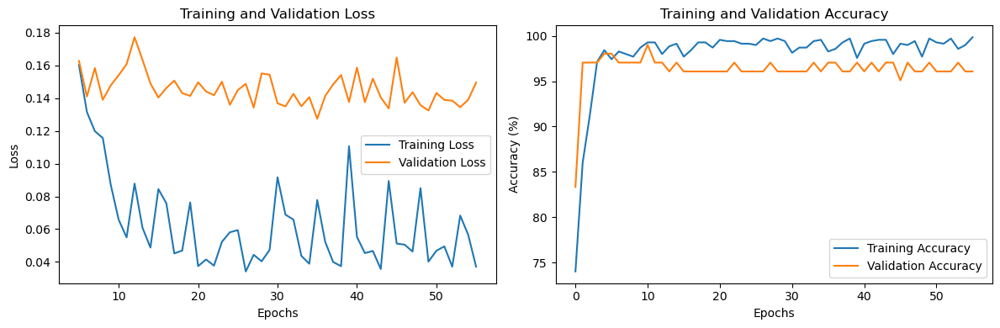

Accuracy of the network on the test set: 93.93939393939394 %, kappa: 0.6150356448476992
[[175   9]
 [  3  11]]
##################################### Iteration  97 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7111415714025497, Training Accuracy: 59.57142857142857%, Avg. Validation Loss: 0.36693577681268963, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.47568833895704965, Training Accuracy: 81.57142857142857%, Avg. Validation Loss: 0.28822119321141926, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4024916927922856, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.26098829082080294, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.30138536339456384, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.1744653114250728, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [41/10000], Avg. Training Loss: 0.055706400106745685, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.07901315816811152, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [42/10000], Avg. Training Loss: 0.035101972266354343, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.0922301784157753, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.05927555172026835, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.0693921090236732, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.03169048437848687, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.10673053562641144, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.0761425188446248, Training Accuracy: 98.57142857142857%, Avg. 

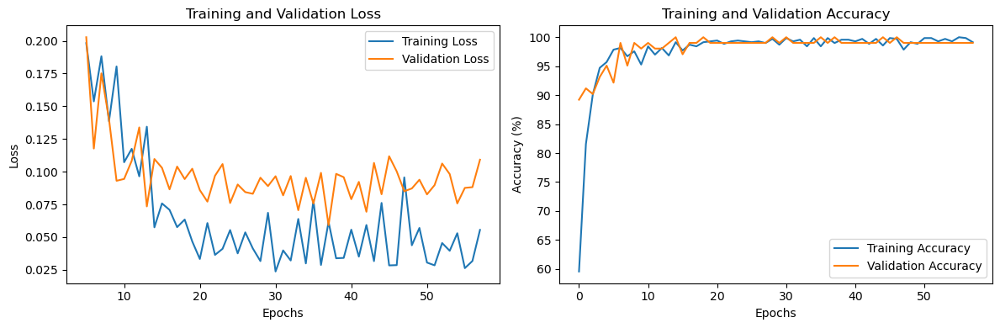

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.6925465838509317
[[180   4]
 [  4  10]]
##################################### Iteration  98 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5331515446305275, Training Accuracy: 74.14285714285714%, Avg. Validation Loss: 0.8281954612050738, Validation Accuracy: 42.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3999549827792428, Training Accuracy: 87.0%, Avg. Validation Loss: 0.6303245850971767, Validation Accuracy: 81.37254901960785%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.29113576662811363, Training Accuracy: 93.85714285714286%, Avg. Validation Loss: 0.49351644941738676, Validation Accuracy: 86.27450980392157%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24269251762465996, Training Accuracy: 94.57142857142857%, Avg. Validation Loss: 0.4620192306382315, Validation Accuracy: 89.2156862745098%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.17798943529

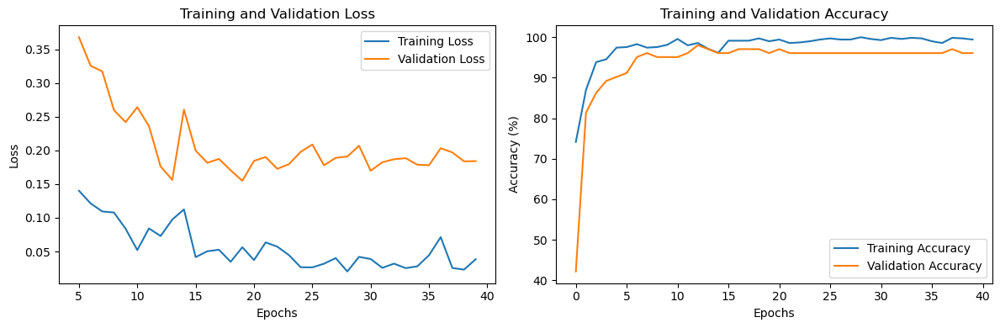

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8354114713216958
[[183   1]
 [  3  11]]
##################################### Iteration  99 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5704604075713591, Training Accuracy: 69.0%, Avg. Validation Loss: 0.4905288645199367, Validation Accuracy: 75.49019607843137%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4260364574464885, Training Accuracy: 83.42857142857143%, Avg. Validation Loss: 0.30118392195020405, Validation Accuracy: 87.25490196078431%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2980256172066385, Training Accuracy: 92.42857142857143%, Avg. Validation Loss: 0.22446533398968832, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2208216627213088, Training Accuracy: 94.85714285714286%, Avg. Validation Loss: 0.17931036757571356, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1847910332

Epoch [41/10000], Avg. Training Loss: 0.03755044029094279, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.12351453197853905, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.027636380548673598, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.10238355611051832, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.06354611134156585, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.07820779351251465, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.03279103122820908, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.08934965836150306, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.04072387461465868, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.07470872945019177, Validation Accuracy: 9

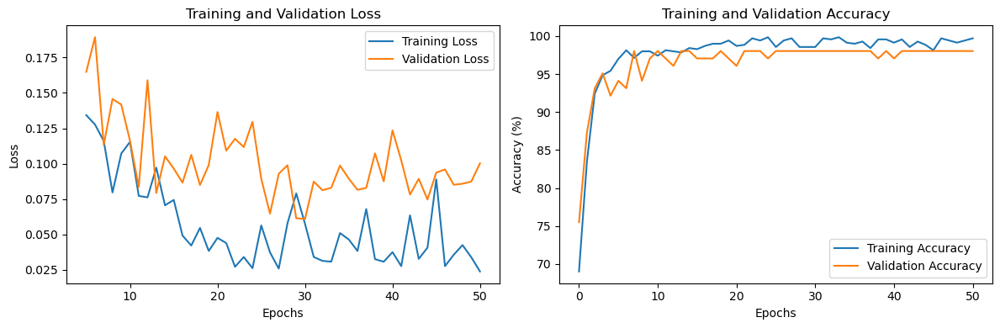

Accuracy of the network on the test set: 100.0 %, kappa: 1.0
[[184   0]
 [  0  14]]
##################################### Iteration  100 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6975258507511832, Training Accuracy: 56.285714285714285%, Avg. Validation Loss: 0.4649628613676344, Validation Accuracy: 94.11764705882354%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5303160832686857, Training Accuracy: 79.14285714285714%, Avg. Validation Loss: 0.3568844667502812, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.402575666254217, Training Accuracy: 89.42857142857143%, Avg. Validation Loss: 0.30011263276849476, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3143818202343854, Training Accuracy: 95.0%, Avg. Validation Loss: 0.2150443834917886, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.23707187480547212, Training Accuracy: 

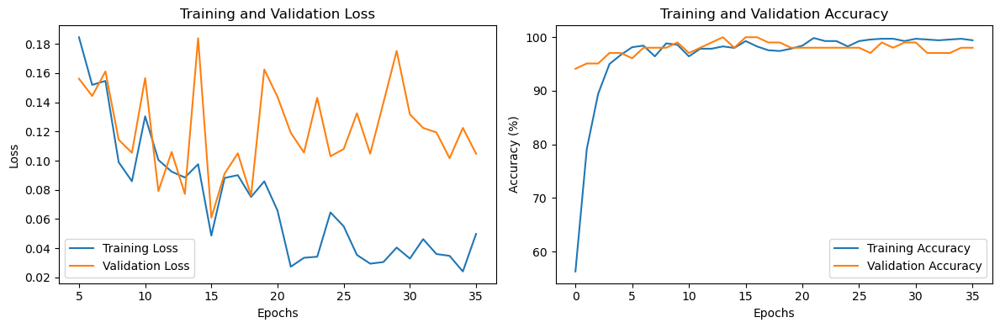

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8228980322003577
[[184   0]
 [  4  10]]


In [8]:
all_data = np.array(data_with_blabel.iloc[:, :], dtype=np.float32)

accuracies = []
kappas = []

fprs = []
tprs = []
fars = []
precisions = []
f1_scores = []
recalls = []
aucs = []

for num_iter in range(100):
    print('##################################### Iteration ', num_iter+1, '#####################################')
    
    # shuffle the data
    np.random.shuffle(all_data)

    # Separate features and labels
    features = all_data[:, :-2]
    labels = all_data[:, -1:]
    multi_labels = all_data[:, -2:-1]

    # Split the data into training, validation, and test sets
    X_train, X_temp, y_train, y_temp, z_train, z_temp = train_test_split(features, labels, multi_labels, test_size=0.3, stratify=multi_labels, random_state=42)
    X_val, X_test, y_val, y_test, z_val, z_test = train_test_split(X_temp, y_temp, z_temp, test_size=0.66, stratify=z_temp, random_state=42)

    # Feature scaling using StandardScaler
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    X_test_scaled = scaler.transform(X_test)

    # Convert to PyTorch tensors
    X_train_tensor = torch.FloatTensor(X_train_scaled)
    y_train_tensor = torch.FloatTensor(y_train)
    z_train_tensor = torch.FloatTensor(z_train)

    X_val_tensor = torch.FloatTensor(X_val_scaled)
    y_val_tensor = torch.FloatTensor(y_val)

    X_test_tensor = torch.FloatTensor(X_test_scaled)
    y_test_tensor = torch.FloatTensor(y_test)

    # Calculate the class distribution
    class_distribution = np.unique(z_train, return_counts=True)[1]

    # Calculate upsampling weights
    class_weights = 1.0 / torch.tensor(class_distribution, dtype=torch.float32)
    sample_weights = class_weights[z_train_tensor.view(-1).long()]

    # Create a WeightedRandomSampler for training DataLoader
    sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)

    # Create TensorDatasets and DataLoaders for training, validation, and test
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

    train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, sampler=sampler)
    train_loader2 = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=False)
    val_loader = DataLoader(dataset=val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

    # Create model
    model = SimpleNN(input_size).to(device)
    
    # Define loss functions and optimizers
    criterion = nn.BCELoss()

    # Exponentially decreasing learning rate
    optimizer = optim.Adam(model.parameters(), lr=target_lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.1, patience=3, verbose=True)
    
    # Learning rate warm-up
    warmup_scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda epoch: (epoch + 1) / warmup_epochs)

    # Early stopping parameters
    early_stopping_patience = 20
    early_stopping_counter = 0
    best_val_loss = float('inf')

    # Lists to store training and validation losses and accuracies
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []
    epochs = []

    # Training loop
    total_step = len(train_loader)
    for epoch in range(num_epochs):
        total_correct_train = 0
        total_samples_train = 0
        running_loss = 0.0

        # Training
        model.train()
        for i, (real_batch, labels) in enumerate(train_loader):
            # Forward pass
            outputs = model(real_batch)
            loss = criterion(outputs, labels)
            
            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            predictions = (outputs > 0.5).float()
            total_correct_train += (predictions == labels).sum().item()
            total_samples_train += labels.size(0)
            running_loss += loss.item()

        # Average training loss
        avg_train_loss = running_loss / len(train_loader)
        train_accuracy = 100 * total_correct_train / total_samples_train

        # Validation
        model.eval()
        val_running_loss = 0.0
        total_correct_val = 0
        total_samples_val = 0
        predictions_val = []
        with torch.no_grad():
            for val_features, val_labels in val_loader:
                val_outputs = model(val_features)
                val_loss = criterion(val_outputs, val_labels)
                val_running_loss += val_loss.item()

                # Calculate validation accuracy
                val_predictions = (val_outputs > 0.5).float()
                predictions_val.extend(val_predictions.cpu().numpy())
                total_correct_val += (val_predictions == val_labels).sum().item()
                total_samples_val += val_labels.size(0)

        # Average validation loss
        avg_val_loss = val_running_loss / len(val_loader)
        val_accuracy = 100 * total_correct_val / total_samples_val

        last_lr = optimizer.param_groups[0]['lr']
        # Log training and validation statistics
        print(f'Epoch [{epoch+1}/{num_epochs}], Avg. Training Loss: {avg_train_loss}, Training Accuracy: {train_accuracy}%, Avg. Validation Loss: {avg_val_loss}, Validation Accuracy: {val_accuracy}%, lr: {last_lr}')

        # Append losses and accuracies to lists
        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)
        train_accuracies.append(train_accuracy)
        val_accuracies.append(val_accuracy)
        epochs.append(epoch)

        # Early stopping check
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            early_stopping_counter = 0
        else:
            early_stopping_counter += 1
            if early_stopping_counter >= early_stopping_patience:
                print("Early stopping due to no improvement in validation loss.")
                break

        # Adjust learning rate based on validation loss
        if epoch+1 < warmup_epochs:
            warmup_scheduler.step()  # Use warm-up scheduler
        else:
            scheduler.step(avg_val_loss)  # Use regular scheduler



    # Plotting the curves
    skp_itrs = 5
    plt.figure(figsize=(12, 4))

    # Plotting loss curves
    plt.subplot(1, 2, 1)
    plt.plot(epochs[skp_itrs:], train_losses[skp_itrs:], label='Training Loss')
    plt.plot(epochs[skp_itrs:], val_losses[skp_itrs:], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plotting accuracy curves
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Test the model
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        predictions_test = []
        scores_test = []  # for AUC calculation
        for images, labels in test_loader:
            outputs = model(images)
            
            # Calculate scores for AUC
            scores_test.extend(outputs.cpu().numpy())
            
    #         print((outputs > 0.5).float())
            predictions = (outputs > 0.5).float()  # Binary thresholding for predictions
            predictions_test.extend(predictions.cpu().numpy())
            total += labels.size(0)
            correct += (predictions == labels.float().view(-1, 1)).sum().item()

        kappa_test = cohen_kappa_score(np.concatenate(predictions_test), y_test_tensor.cpu().numpy())
        print('Accuracy of the network on the test set: {} %, kappa: {}'.format(100 * correct / total, kappa_test))
        conf_matrix = confusion_matrix(y_test_tensor.cpu().numpy(), np.concatenate(predictions_test))
        print(conf_matrix)
        
        # Extract values from the confusion matrix
        TN, FP, FN, TP = conf_matrix.ravel()
        
        # Calculate metrics
        fpr = FP / (FP + TN)
        tpr = TP / (TP + FN)
        far = 1 - tpr
        precision = TP / (TP + FP)
        recall = TP / (TP + FN)
        f1 = 2 * (precision * recall) / (precision + recall)

        fpr_auc, tpr_auc, _ = roc_curve(y_test_tensor.cpu().numpy(), np.concatenate(scores_test))
        roc_auc = auc(fpr_auc, tpr_auc)
        
        accuracies.append(100 * correct / total)
        kappas.append(kappa_test)
        
        fprs.append(fpr)
        tprs.append(tpr)
        fars.append(far)
        precisions.append(precision)
        f1_scores.append(f1)
        recalls.append(recall)
        aucs.append(roc_auc)

In [9]:
{'accuracy': np.mean(accuracies), 'kappa':np.mean(kappas), 'fpr':np.mean(fprs), 'tpr':np.mean(tprs), 'far':np.mean(fars), 'precision':np.mean(precisions), 'recall':np.mean(recalls), 'f1_scores':np.mean(f1_scores), 'auc':np.mean(aucs)}

{'accuracy': 97.30808080808082,
 'kappa': 0.8064275685910056,
 'fpr': 0.018641304347826085,
 'tpr': 0.8642857142857143,
 'far': 0.1357142857142857,
 'precision': 0.7939042558576613,
 'recall': 0.8642857142857143,
 'f1_scores': 0.8207673671151906,
 'auc': 0.9911102484472049}